# Regularization

Welcome to the second assignment of this week. Deep Learning models have so much flexibility and capacity that **overfitting can be a serious problem**, if the training dataset is not big enough. Sure it does well on the training set, but the learned network **doesn't generalize to new examples** that it has never seen!

**You will learn to:** Use regularization in your deep learning models.

Let's get started!

## Important Note on Submission to the AutoGrader

Before submitting your assignment to the AutoGrader, please make sure you are not doing the following:

1. You have not added any _extra_ `print` statement(s) in the assignment.
2. You have not added any _extra_ code cell(s) in the assignment.
3. You have not changed any of the function parameters.
4. You are not using any global variables inside your graded exercises. Unless specifically instructed to do so, please refrain from it and use the local variables instead.
5. You are not changing the assignment code where it is not required, like creating _extra_ variables.

If you do any of the following, you will get something like, `Grader not found` (or similarly unexpected) error upon submitting your assignment. Before asking for help/debugging the errors in your assignment, check for these first. If this is the case, and you don't remember the changes you have made, you can get a fresh copy of the assignment by following these [instructions](https://www.coursera.org/learn/deep-neural-network/supplement/QWEnZ/h-ow-to-refresh-your-workspace).

## Table of Contents
- [1 - Packages](#1)
- [2 - Problem Statement](#2)
- [3 - Loading the Dataset](#3)
- [4 - Non-Regularized Model](#4)
- [5 - L2 Regularization](#5)
    - [Exercise 1 - compute_cost_with_regularization](#ex-1)
    - [Exercise 2 - backward_propagation_with_regularization](#ex-2)
- [6 - Dropout](#6)
    - [6.1 - Forward Propagation with Dropout](#6-1)
        - [Exercise 3 - forward_propagation_with_dropout](#ex-3)
    - [6.2 - Backward Propagation with Dropout](#6-2)
        - [Exercise 4 - backward_propagation_with_dropout](#ex-4)
- [7 - Conclusions](#7)

<a name='1'></a>
## 1 - Packages

In [1]:
# import packages
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import sklearn.datasets
import scipy.io
from reg_utils import sigmoid, relu, plot_decision_boundary, initialize_parameters, load_2D_dataset, predict_dec
from reg_utils import compute_cost, predict, forward_propagation, backward_propagation, update_parameters
from testCases import *
from public_tests import *

%matplotlib inline
plt.rcParams['figure.figsize'] = (7.0, 4.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

<a name='2'></a>
## 2 - Problem Statement

You have just been hired as an AI expert by the French Football Corporation. They would like you to recommend positions where France's goal keeper should kick the ball so that the French team's players can then hit it with their head. 

<img src="images/field_kiank.png" style="width:600px;height:350px;">

<caption><center><font color='purple'><b>Figure 1</b>: Football field. The goal keeper kicks the ball in the air, the players of each team are fighting to hit the ball with their head </font></center></caption>


They give you the following 2D dataset from France's past 10 games.

<a name='3'></a>
## 3 - Loading the Dataset

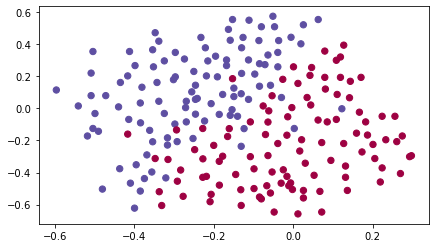

In [2]:
train_X, train_Y, test_X, test_Y = load_2D_dataset()

Each dot corresponds to a position on the football field where a football player has hit the ball with his/her head after the French goal keeper has shot the ball from the left side of the football field.
- If the dot is blue, it means the French player managed to hit the ball with his/her head
- If the dot is red, it means the other team's player hit the ball with their head

**Your goal**: Use a deep learning model to find the positions on the field where the goalkeeper should kick the ball.

**Analysis of the dataset**: This dataset is a little noisy, but it looks like a diagonal line separating the upper left half (blue) from the lower right half (red) would work well. 

You will first try a non-regularized model. Then you'll learn how to regularize it and decide which model you will choose to solve the French Football Corporation's problem. 

<a name='4'></a>
## 4 - Non-Regularized Model

You will use the following neural network (already implemented for you below). This model can be used:
- in *regularization mode* -- by setting the `lambd` input to a non-zero value. We use "`lambd`" instead of "`lambda`" because "`lambda`" is a reserved keyword in Python. 
- in *dropout mode* -- by setting the `keep_prob` to a value less than one

You will first try the model without any regularization. Then, you will implement:
- *L2 regularization* -- functions: "`compute_cost_with_regularization()`" and "`backward_propagation_with_regularization()`"
- *Dropout* -- functions: "`forward_propagation_with_dropout()`" and "`backward_propagation_with_dropout()`"

In each part, you will run this model with the correct inputs so that it calls the functions you've implemented. Take a look at the code below to familiarize yourself with the model.

In [3]:
def model(X, Y, learning_rate = 0.3, num_iterations = 30000, print_cost = True, lambd = 0, keep_prob = 1):
    """
    Implements a three-layer neural network: LINEAR->RELU->LINEAR->RELU->LINEAR->SIGMOID.
    
    Arguments:
    X -- input data, of shape (input size, number of examples)
    Y -- true "label" vector (1 for blue dot / 0 for red dot), of shape (output size, number of examples)
    learning_rate -- learning rate of the optimization
    num_iterations -- number of iterations of the optimization loop
    print_cost -- If True, print the cost every 10000 iterations
    lambd -- regularization hyperparameter, scalar
    keep_prob - probability of keeping a neuron active during drop-out, scalar.
    
    Returns:
    parameters -- parameters learned by the model. They can then be used to predict.
    """
        
    grads = {}
    costs = []                            # to keep track of the cost
    m = X.shape[1]                        # number of examples
    layers_dims = [X.shape[0], 20, 3, 1]
    
    # Initialize parameters dictionary.
    parameters = initialize_parameters(layers_dims)

    # Loop (gradient descent)

    for i in range(0, num_iterations):

        # Forward propagation: LINEAR -> RELU -> LINEAR -> RELU -> LINEAR -> SIGMOID.
        if keep_prob == 1:
            a3, cache = forward_propagation(X, parameters)
        elif keep_prob < 1:
            a3, cache = forward_propagation_with_dropout(X, parameters, keep_prob)
        
        # Cost function
        if lambd == 0:
            cost = compute_cost(a3, Y)
        else:
            cost = compute_cost_with_regularization(a3, Y, parameters, lambd)
            
        # Backward propagation.
        assert (lambd == 0 or keep_prob == 1)   # it is possible to use both L2 regularization and dropout, 
                                                # but this assignment will only explore one at a time
        if lambd == 0 and keep_prob == 1:
            grads = backward_propagation(X, Y, cache)
        elif lambd != 0:
            grads = backward_propagation_with_regularization(X, Y, cache, lambd)
        elif keep_prob < 1:
            grads = backward_propagation_with_dropout(X, Y, cache, keep_prob)
        
        # Update parameters.
        parameters = update_parameters(parameters, grads, learning_rate)
        
        # Print the loss every 10000 iterations
        if print_cost and i % 10000 == 0:
            print("Cost after iteration {}: {}".format(i, cost))
        if print_cost and i % 1000 == 0:
            costs.append(cost)
    
    # plot the cost
    plt.plot(costs)
    plt.ylabel('cost')
    plt.xlabel('iterations (x1,000)')
    plt.title("Learning rate =" + str(learning_rate))
    plt.show()
    
    return parameters

Let's train the model without any regularization, and observe the accuracy on the train/test sets.

Cost after iteration 0: 0.6557412523481002
Cost after iteration 10000: 0.16329987525724204
Cost after iteration 20000: 0.13851642423234922


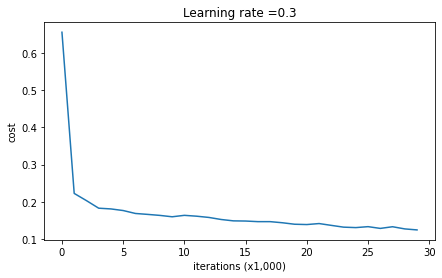

On the training set:
Accuracy: 0.9478672985781991
On the test set:
Accuracy: 0.915


In [4]:
parameters = model(train_X, train_Y)
print ("On the training set:")
predictions_train = predict(train_X, train_Y, parameters)
print ("On the test set:")
predictions_test = predict(test_X, test_Y, parameters)

The train accuracy is 94.8% while the test accuracy is 91.5%. This is the **baseline model** (you will observe the impact of regularization on this model). Run the following code to plot the decision boundary of your model.

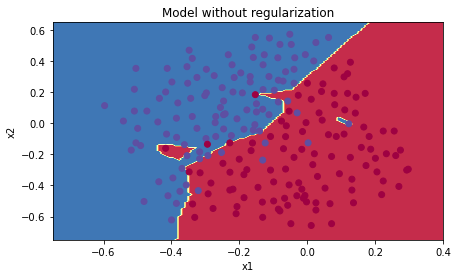

In [5]:
plt.title("Model without regularization")
axes = plt.gca()
axes.set_xlim([-0.75,0.40])
axes.set_ylim([-0.75,0.65])
plot_decision_boundary(lambda x: predict_dec(parameters, x.T), train_X, train_Y)

The non-regularized model is obviously overfitting the training set. It is fitting the noisy points! Lets now look at two techniques to reduce overfitting.

<a name='5'></a>
## 5 - L2 Regularization

The standard way to avoid overfitting is called **L2 regularization**. It consists of appropriately modifying your cost function, from:
$$J = -\frac{1}{m} \sum\limits_{i = 1}^{m} \large{(}\small  y^{(i)}\log\left(a^{[L](i)}\right) + (1-y^{(i)})\log\left(1- a^{[L](i)}\right) \large{)} \tag{1}$$
To:
$$J_{regularized} = \small \underbrace{-\frac{1}{m} \sum\limits_{i = 1}^{m} \large{(}\small y^{(i)}\log\left(a^{[L](i)}\right) + (1-y^{(i)})\log\left(1- a^{[L](i)}\right) \large{)} }_\text{cross-entropy cost} + \underbrace{\frac{1}{m} \frac{\lambda}{2} \sum\limits_l\sum\limits_k\sum\limits_j W_{k,j}^{[l]2} }_\text{L2 regularization cost} \tag{2}$$

Let's modify your cost and observe the consequences.

<a name='ex-1'></a>
### Exercise 1 - compute_cost_with_regularization
Implement `compute_cost_with_regularization()` which computes the cost given by formula (2). To calculate $\sum\limits_k\sum\limits_j W_{k,j}^{[l]2}$  , use :
```python
np.sum(np.square(Wl))
```
Note that you have to do this for $W^{[1]}$, $W^{[2]}$ and $W^{[3]}$, then sum the three terms and multiply by $ \frac{1}{m} \frac{\lambda}{2} $.

In [6]:
# GRADED FUNCTION: compute_cost_with_regularization

def compute_cost_with_regularization(A3, Y, parameters, lambd):
    """
    Implement the cost function with L2 regularization. See formula (2) above.
    
    Arguments:
    A3 -- post-activation, output of forward propagation, of shape (output size, number of examples)
    Y -- "true" labels vector, of shape (output size, number of examples)
    parameters -- python dictionary containing parameters of the model
    
    Returns:
    cost - value of the regularized loss function (formula (2))
    """
    m = Y.shape[1]
    W1 = parameters["W1"]
    W2 = parameters["W2"]
    W3 = parameters["W3"]
    
    cross_entropy_cost = compute_cost(A3, Y) # This gives you the cross-entropy part of the cost
    
    #(≈ 1 lines of code)
    L2_regularization_cost = (np.sum(np.square(W1))+np.sum(np.square(W2))+np.sum(np.square(W3)))*(lambd/(2*m))
    # YOUR CODE STARTS HERE
    
    
    # YOUR CODE ENDS HERE
    
    cost = cross_entropy_cost + L2_regularization_cost
    
    return cost

In [7]:
A3, t_Y, parameters = compute_cost_with_regularization_test_case()
cost = compute_cost_with_regularization(A3, t_Y, parameters, lambd=0.1)
print("cost = " + str(cost))

compute_cost_with_regularization_test(compute_cost_with_regularization)

cost = 1.7864859451590758
 All tests passed.


Of course, because you changed the cost, you have to change backward propagation as well! All the gradients have to be computed with respect to this new cost. 

<a name='ex-2'></a>
### Exercise 2 - backward_propagation_with_regularization
Implement the changes needed in backward propagation to take into account regularization. The changes only concern dW1, dW2 and dW3. For each, you have to add the regularization term's gradient ($\frac{d}{dW} ( \frac{1}{2}\frac{\lambda}{m}  W^2) = \frac{\lambda}{m} W$).

In [14]:
# GRADED FUNCTION: backward_propagation_with_regularization

def backward_propagation_with_regularization(X, Y, cache, lambd):
    """
    Implements the backward propagation of our baseline model to which we added an L2 regularization.
    
    Arguments:
    X -- input dataset, of shape (input size, number of examples)
    Y -- "true" labels vector, of shape (output size, number of examples)
    cache -- cache output from forward_propagation()
    lambd -- regularization hyperparameter, scalar
    
    Returns:
    gradients -- A dictionary with the gradients with respect to each parameter, activation and pre-activation variables
    """
    
    m = X.shape[1]
    (Z1, A1, W1, b1, Z2, A2, W2, b2, Z3, A3, W3, b3) = cache
    
    dZ3 = A3 - Y
    #(≈ 1 lines of code)
    dW3 = 1./m * np.dot(dZ3, A2.T)  + lambd*W3/m
    # YOUR CODE STARTS HERE
    
    
    # YOUR CODE ENDS HERE
    db3 = 1. / m * np.sum(dZ3, axis=1, keepdims=True)
    
    dA2 = np.dot(W3.T, dZ3)
    dZ2 = np.multiply(dA2, np.int64(A2 > 0))
    #(≈ 1 lines of code)
    dW2 = 1./m * np.dot(dZ2, A1.T)  + lambd*W2/m
    # YOUR CODE STARTS HERE
    
    
    # YOUR CODE ENDS HERE
    db2 = 1. / m * np.sum(dZ2, axis=1, keepdims=True)
    
    dA1 = np.dot(W2.T, dZ2)
    dZ1 = np.multiply(dA1, np.int64(A1 > 0))
    #(≈ 1 lines of code)
    dW1 = 1./m * np.dot(dZ1, X.T)  + lambd*W1/m
    # YOUR CODE STARTS HERE
    
    
    # YOUR CODE ENDS HERE
    db1 = 1. / m * np.sum(dZ1, axis=1, keepdims=True)
    
    gradients = {"dZ3": dZ3, "dW3": dW3, "db3": db3,"dA2": dA2,
                 "dZ2": dZ2, "dW2": dW2, "db2": db2, "dA1": dA1, 
                 "dZ1": dZ1, "dW1": dW1, "db1": db1}
    
    return gradients

In [15]:
t_X, t_Y, cache = backward_propagation_with_regularization_test_case()

grads = backward_propagation_with_regularization(t_X, t_Y, cache, lambd = 0.7)
print ("dW1 = \n"+ str(grads["dW1"]))
print ("dW2 = \n"+ str(grads["dW2"]))
print ("dW3 = \n"+ str(grads["dW3"]))
backward_propagation_with_regularization_test(backward_propagation_with_regularization)

dW1 = 
[[-0.25604646  0.12298827 -0.28297129]
 [-0.17706303  0.34536094 -0.4410571 ]]
dW2 = 
[[ 0.79276486  0.85133918]
 [-0.0957219  -0.01720463]
 [-0.13100772 -0.03750433]]
dW3 = 
[[-1.77691347 -0.11832879 -0.09397446]]
 All tests passed.


Let's now run the model with L2 regularization $(\lambda = 0.7)$. The `model()` function will call: 
- `compute_cost_with_regularization` instead of `compute_cost`
- `backward_propagation_with_regularization` instead of `backward_propagation`

Cost after iteration 0: 0.6974484493131264
Cost after iteration 10000: 0.2684918873282239
Cost after iteration 20000: 0.26809163371273015


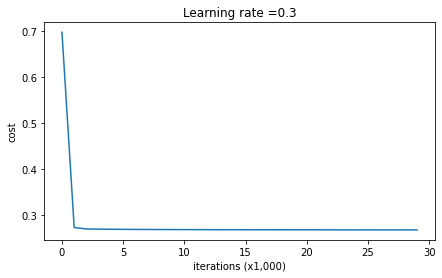

On the train set:
Accuracy: 0.9383886255924171
On the test set:
Accuracy: 0.93


In [16]:
parameters = model(train_X, train_Y, lambd = 0.7)
print ("On the train set:")
predictions_train = predict(train_X, train_Y, parameters)
print ("On the test set:")
predictions_test = predict(test_X, test_Y, parameters)

Congrats, the test set accuracy increased to 93%. You have saved the French football team!

You are not overfitting the training data anymore. Let's plot the decision boundary.

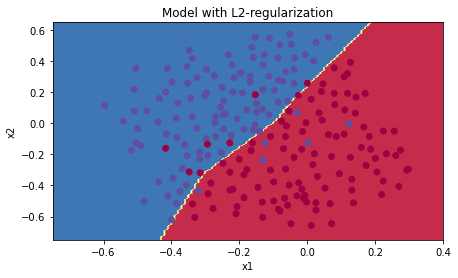

In [17]:
plt.title("Model with L2-regularization")
axes = plt.gca()
axes.set_xlim([-0.75,0.40])
axes.set_ylim([-0.75,0.65])
plot_decision_boundary(lambda x: predict_dec(parameters, x.T), train_X, train_Y)

**Observations**:
- The value of $\lambda$ is a hyperparameter that you can tune using a dev set.
- L2 regularization makes your decision boundary smoother. If $\lambda$ is too large, it is also possible to "oversmooth", resulting in a model with high bias.

**What is L2-regularization actually doing?**:

L2-regularization relies on the assumption that a model with small weights is simpler than a model with large weights. Thus, by penalizing the square values of the weights in the cost function you drive all the weights to smaller values. It becomes too costly for the cost to have large weights! This leads to a smoother model in which the output changes more slowly as the input changes. 

<br>
<font color='blue'>
    
**What you should remember:** the implications of L2-regularization on:
- The cost computation:
    - A regularization term is added to the cost.
- The backpropagation function:
    - There are extra terms in the gradients with respect to weight matrices.
- Weights end up smaller ("weight decay"): 
    - Weights are pushed to smaller values.

<a name='6'></a>
## 6 - Dropout

Finally, **dropout** is a widely used regularization technique that is specific to deep learning. 
**It randomly shuts down some neurons in each iteration.** Watch these two videos to see what this means!

<!--
To understand drop-out, consider this conversation with a friend:
- Friend: "Why do you need all these neurons to train your network and classify images?". 
- You: "Because each neuron contains a weight and can learn specific features/details/shape of an image. The more neurons I have, the more featurse my model learns!"
- Friend: "I see, but are you sure that your neurons are learning different features and not all the same features?"
- You: "Good point... Neurons in the same layer actually don't talk to each other. It should be definitly possible that they learn the same image features/shapes/forms/details... which would be redundant. There should be a solution."
!--> 


<center>
<video width="620" height="440" src="images/dropout1_kiank.mp4" type="video/mp4" controls>
</video>
</center>
<br>
<caption><center><font color='purple'><b>Figure 2 </b>: <b>Drop-out on the second hidden layer.</b> <br> At each iteration, you shut down (= set to zero) each neuron of a layer with probability $1 - keep\_prob$ or keep it with probability $keep\_prob$ (50% here). The dropped neurons don't contribute to the training in both the forward and backward propagations of the iteration. </font></center></caption>

<center>
<video width="620" height="440" src="images/dropout2_kiank.mp4" type="video/mp4" controls>
</video>
</center>

<caption><center><font color='purple'><b>Figure 3</b>:<b> Drop-out on the first and third hidden layers. </b><br> $1^{st}$ layer: we shut down on average 40% of the neurons.  $3^{rd}$ layer: we shut down on average 20% of the neurons. </font></center></caption>


When you shut some neurons down, you actually modify your model. The idea behind drop-out is that at each iteration, you train a different model that uses only a subset of your neurons. With dropout, your neurons thus become less sensitive to the activation of one other specific neuron, because that other neuron might be shut down at any time. 

<a name='6-1'></a>
### 6.1 - Forward Propagation with Dropout

<a name='ex-3'></a>
### Exercise 3 - forward_propagation_with_dropout

Implement the forward propagation with dropout. You are using a 3 layer neural network, and will add dropout to the first and second hidden layers. We will not apply dropout to the input layer or output layer. 

**Instructions**:
You would like to shut down some neurons in the first and second layers. To do that, you are going to carry out 4 Steps:
1. In lecture, we dicussed creating a variable $d^{[1]}$ with the same shape as $a^{[1]}$ using `np.random.rand()` to randomly get numbers between 0 and 1. Here, you will use a vectorized implementation, so create a random matrix $D^{[1]} = [d^{[1](1)} d^{[1](2)} ... d^{[1](m)}] $ of the same dimension as $A^{[1]}$.
2. Set each entry of $D^{[1]}$ to be 1 with probability (`keep_prob`), and 0 otherwise.

**Hint:** Let's say that keep_prob = 0.8, which means that we want to keep about 80% of the neurons and drop out about 20% of them.  We want to generate a vector that has 1's and 0's, where about 80% of them are 1 and about 20% are 0.
This python statement:  
`X = (X < keep_prob).astype(int)`  

is conceptually the same as this if-else statement (for the simple case of a one-dimensional array) :

```
for i,v in enumerate(x):
    if v < keep_prob:
        x[i] = 1
    else: # v >= keep_prob
        x[i] = 0
```
Note that the `X = (X < keep_prob).astype(int)` works with multi-dimensional arrays, and the resulting output preserves the dimensions of the input array.

Also note that without using `.astype(int)`, the result is an array of booleans `True` and `False`, which Python automatically converts to 1 and 0 if we multiply it with numbers.  (However, it's better practice to convert data into the data type that we intend, so try using `.astype(int)`.)

3. Set $A^{[1]}$ to $A^{[1]} * D^{[1]}$. (You are shutting down some neurons). You can think of $D^{[1]}$ as a mask, so that when it is multiplied with another matrix, it shuts down some of the values.
4. Divide $A^{[1]}$ by `keep_prob`. By doing this you are assuring that the result of the cost will still have the same expected value as without drop-out. (This technique is also called inverted dropout.)

In [30]:
# GRADED FUNCTION: forward_propagation_with_dropout

def forward_propagation_with_dropout(X, parameters, keep_prob = 0.5):
    """
    Implements the forward propagation: LINEAR -> RELU + DROPOUT -> LINEAR -> RELU + DROPOUT -> LINEAR -> SIGMOID.
    
    Arguments:
    X -- input dataset, of shape (2, number of examples)
    parameters -- python dictionary containing your parameters "W1", "b1", "W2", "b2", "W3", "b3":
                    W1 -- weight matrix of shape (20, 2)
                    b1 -- bias vector of shape (20, 1)
                    W2 -- weight matrix of shape (3, 20)
                    b2 -- bias vector of shape (3, 1)
                    W3 -- weight matrix of shape (1, 3)
                    b3 -- bias vector of shape (1, 1)
    keep_prob - probability of keeping a neuron active during drop-out, scalar
    
    Returns:
    A3 -- last activation value, output of the forward propagation, of shape (1,1)
    cache -- tuple, information stored for computing the backward propagation
    """
    
    np.random.seed(1)
    
    # retrieve parameters
    W1 = parameters["W1"]
    b1 = parameters["b1"]
    W2 = parameters["W2"]
    b2 = parameters["b2"]
    W3 = parameters["W3"]
    b3 = parameters["b3"]
    
    # LINEAR -> RELU -> LINEAR -> RELU -> LINEAR -> SIGMOID
    Z1 = np.dot(W1, X) + b1
    A1 = relu(Z1)
    #(≈ 4 lines of code)         # Steps 1-4 below correspond to the Steps 1-4 described above. 
    print(A1, A1.shape)
    D1 = np.random.rand(A1.shape[0],A1.shape[1])                                          # Step 1: initialize matrix D1 = np.random.rand(..., ...)
    D1 = (D1<keep_prob).astype(int)                                          # Step 2: convert entries of D1 to 0 or 1 (using keep_prob as the threshold)
    A1 = A1*D1                                          # Step 3: shut down some neurons of A1
    A1 = A1/keep_prob                                          # Step 4: scale the value of neurons that haven't been shut down
    # YOUR CODE STARTS HERE
    
    
    # YOUR CODE ENDS HERE
    Z2 = np.dot(W2, A1) + b2
    A2 = relu(Z2)
    #(≈ 4 lines of code)
    D2 =np.random.rand(A2.shape[0], A2.shape[1])                                           # Step 1: initialize matrix D2 = np.random.rand(..., ...)
    D2 = (D2<keep_prob).astype(int)                                          # Step 2: convert entries of D2 to 0 or 1 (using keep_prob as the threshold)
    A2 = A2*D2                                          # Step 3: shut down some neurons of A2
    A2 = A2/keep_prob                                          # Step 4: scale the value of neurons that haven't been shut down
    # YOUR CODE STARTS HERE
    
    
    # YOUR CODE ENDS HERE
    Z3 = np.dot(W3, A2) + b3
    A3 = sigmoid(Z3)
    
    cache = (Z1, D1, A1, W1, b1, Z2, D2, A2, W2, b2, Z3, A3, W3, b3)
    
    return A3, cache

In [31]:
t_X, parameters = forward_propagation_with_dropout_test_case()

A3, cache = forward_propagation_with_dropout(t_X, parameters, keep_prob=0.7)
print ("A3 = " + str(A3))

forward_propagation_with_dropout_test(forward_propagation_with_dropout)

[[0.         3.32524635 2.13994541 2.60700654 0.        ]
 [0.         4.1600994  0.79051021 1.46493512 0.        ]] (2, 5)
A3 = [[0.36974721 0.00305176 0.04565099 0.49683389 0.36974721]]
[[0.         3.32524635 2.13994541 2.60700654 0.        ]
 [0.         4.1600994  0.79051021 1.46493512 0.        ]] (2, 5)
[[0.         3.32524635 2.13994541 2.60700654 0.        ]
 [0.         4.1600994  0.79051021 1.46493512 0.        ]] (2, 5)
 All tests passed.


<a name='6-2'></a>
### 6.2 - Backward Propagation with Dropout

<a name='ex-4'></a>
### Exercise 4 - backward_propagation_with_dropout
Implement the backward propagation with dropout. As before, you are training a 3 layer network. Add dropout to the first and second hidden layers, using the masks $D^{[1]}$ and $D^{[2]}$ stored in the cache. 

**Instruction**:
Backpropagation with dropout is actually quite easy. You will have to carry out 2 Steps:
1. You had previously shut down some neurons during forward propagation, by applying a mask $D^{[1]}$ to `A1`. In backpropagation, you will have to shut down the same neurons, by reapplying the same mask $D^{[1]}$ to `dA1`. 
2. During forward propagation, you had divided `A1` by `keep_prob`. In backpropagation, you'll therefore have to divide `dA1` by `keep_prob` again (the calculus interpretation is that if $A^{[1]}$ is scaled by `keep_prob`, then its derivative $dA^{[1]}$ is also scaled by the same `keep_prob`).


In [32]:
# GRADED FUNCTION: backward_propagation_with_dropout

def backward_propagation_with_dropout(X, Y, cache, keep_prob):
    """
    Implements the backward propagation of our baseline model to which we added dropout.
    
    Arguments:
    X -- input dataset, of shape (2, number of examples)
    Y -- "true" labels vector, of shape (output size, number of examples)
    cache -- cache output from forward_propagation_with_dropout()
    keep_prob - probability of keeping a neuron active during drop-out, scalar
    
    Returns:
    gradients -- A dictionary with the gradients with respect to each parameter, activation and pre-activation variables
    """
    
    m = X.shape[1]
    (Z1, D1, A1, W1, b1, Z2, D2, A2, W2, b2, Z3, A3, W3, b3) = cache
    
    dZ3 = A3 - Y
    dW3 = 1./m * np.dot(dZ3, A2.T)
    db3 = 1./m * np.sum(dZ3, axis=1, keepdims=True)
    dA2 = np.dot(W3.T, dZ3)
    #(≈ 2 lines of code)
    dA2 = dA2*D2               # Step 1: Apply mask D2 to shut down the same neurons as during the forward propagation
    dA2 = dA2/keep_prob               # Step 2: Scale the value of neurons that haven't been shut down
    # YOUR CODE STARTS HERE
    
    
    # YOUR CODE ENDS HERE
    dZ2 = np.multiply(dA2, np.int64(A2 > 0))
    dW2 = 1./m * np.dot(dZ2, A1.T)
    db2 = 1./m * np.sum(dZ2, axis=1, keepdims=True)
    
    dA1 = np.dot(W2.T, dZ2)
    #(≈ 2 lines of code)
    dA1 = dA1*D1               # Step 1: Apply mask D1 to shut down the same neurons as during the forward propagation
    dA1 = dA1/keep_prob               # Step 2: Scale the value of neurons that haven't been shut down
    # YOUR CODE STARTS HERE
    
    
    # YOUR CODE ENDS HERE
    dZ1 = np.multiply(dA1, np.int64(A1 > 0))
    dW1 = 1./m * np.dot(dZ1, X.T)
    db1 = 1./m * np.sum(dZ1, axis=1, keepdims=True)
    
    gradients = {"dZ3": dZ3, "dW3": dW3, "db3": db3,"dA2": dA2,
                 "dZ2": dZ2, "dW2": dW2, "db2": db2, "dA1": dA1, 
                 "dZ1": dZ1, "dW1": dW1, "db1": db1}
    
    return gradients

In [33]:
t_X, t_Y, cache = backward_propagation_with_dropout_test_case()

gradients = backward_propagation_with_dropout(t_X, t_Y, cache, keep_prob=0.8)

print ("dA1 = \n" + str(gradients["dA1"]))
print ("dA2 = \n" + str(gradients["dA2"]))

backward_propagation_with_dropout_test(backward_propagation_with_dropout)

dA1 = 
[[ 0.36544439  0.         -0.00188233  0.         -0.17408748]
 [ 0.65515713  0.         -0.00337459  0.         -0.        ]]
dA2 = 
[[ 0.58180856  0.         -0.00299679  0.         -0.27715731]
 [ 0.          0.53159854 -0.          0.53159854 -0.34089673]
 [ 0.          0.         -0.00292733  0.         -0.        ]]
 All tests passed.


Let's now run the model with dropout (`keep_prob = 0.86`). It means at every iteration you shut down each neurons of layer 1 and 2 with 14% probability. The function `model()` will now call:
- `forward_propagation_with_dropout` instead of `forward_propagation`.
- `backward_propagation_with_dropout` instead of `backward_propagation`.

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.28005504 0.15754854 0.        ]
 [0.         0.         0.01022351 ... 0.11959653 0.09150405 0.        ]
 ...
 [0.         0.         0.         ... 0.57175484 0.39773852 0.        ]
 [0.         0.         0.07347163 ... 0.37278338 0.28971773 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
Cost after iteration 0: 0.6543912405149825
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.28879666 0.16605132 0.        ]
 [0.         0.         0.00863758 ... 0.11787153 0.08980842 0.        ]
 ...
 [0.         0.         0.         ... 0.57140837 0.39735219 0.        ]
 [0.         0.         0.06756149 ... 0.36500177 0.28221693 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.        

[[0.0284008  0.         0.         ... 0.         0.         0.0034284 ]
 [0.         0.         0.         ... 0.32809213 0.20431047 0.        ]
 [0.         0.         0.         ... 0.10360101 0.07567885 0.        ]
 ...
 [0.         0.         0.         ... 0.6222224  0.45026465 0.        ]
 [0.         0.         0.         ... 0.18308055 0.10969754 0.        ]
 [0.         0.         0.         ... 0.15459297 0.12098094 0.08166574]] (20, 211)
[[0.0295463  0.         0.         ... 0.         0.         0.00454627]
 [0.         0.         0.         ... 0.32793579 0.2041479  0.        ]
 [0.         0.         0.         ... 0.10360174 0.07568268 0.        ]
 ...
 [0.         0.         0.         ... 0.62220874 0.45026149 0.        ]
 [0.         0.         0.         ... 0.18224269 0.10888555 0.        ]
 [0.         0.         0.         ... 0.1565859  0.12295047 0.08360624]] (20, 211)
[[0.02803194 0.         0.         ... 0.         0.         0.00316748]
 [0.         0.    

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.33398185 0.205548   0.        ]
 [0.         0.         0.         ... 0.09970991 0.0729354  0.        ]
 ...
 [0.         0.         0.         ... 0.68077727 0.5081368  0.        ]
 [0.         0.         0.         ... 0.05992106 0.         0.        ]
 [0.         0.         0.         ... 0.12115275 0.07916029 0.01750553]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.33379347 0.20530964 0.        ]
 [0.         0.         0.         ... 0.09985538 0.07308314 0.        ]
 ...
 [0.         0.         0.         ... 0.68090679 0.50824477 0.        ]
 [0.         0.         0.         ... 0.05977629 0.         0.        ]
 [0.         0.         0.         ... 0.11809314 0.07615155 0.01472832]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.    

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.37107037 0.23520714 0.        ]
 [0.         0.         0.01892823 ... 0.11137976 0.08564566 0.        ]
 ...
 [0.         0.         0.         ... 0.64867042 0.46822042 0.        ]
 [0.         0.         0.         ... 0.05226854 0.         0.        ]
 [0.         0.         0.         ... 0.10863511 0.06559435 0.00343132]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.37071155 0.23481868 0.        ]
 [0.         0.         0.01900852 ... 0.11140767 0.08568168 0.        ]
 ...
 [0.         0.         0.         ... 0.64856854 0.46805242 0.        ]
 [0.         0.         0.         ... 0.05212039 0.         0.        ]
 [0.         0.         0.         ... 0.1113264  0.06823038 0.00586641]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.0000000

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.3992108  0.25902487 0.        ]
 [0.06528172 0.09856358 0.15863986 ... 0.23740164 0.21257395 0.11387668]
 ...
 [0.         0.         0.         ... 0.62967609 0.43919005 0.        ]
 [0.         0.         0.         ... 0.05143447 0.         0.        ]
 [0.         0.         0.         ... 0.06392661 0.01431997 0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.4011129  0.26091001 0.        ]
 [0.0662776  0.09961338 0.15972758 ... 0.23841236 0.21358253 0.11486047]
 ...
 [0.         0.         0.         ... 0.62964109 0.43909708 0.        ]
 [0.         0.         0.         ... 0.05165551 0.         0.        ]
 [0.         0.         0.         ... 0.06186669 0.01223692 0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.    

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.4252405  0.28130956 0.        ]
 [0.30601754 0.35435493 0.42225603 ... 0.47001745 0.44635817 0.34702267]
 ...
 [0.         0.         0.         ... 0.62496668 0.4225222  0.        ]
 [0.         0.         0.         ... 0.05875839 0.         0.        ]
 [0.         0.         0.         ... 0.06088825 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.42499111 0.28103755 0.        ]
 [0.30834283 0.35680723 0.42477933 ... 0.47229639 0.44864377 0.34929155]
 ...
 [0.         0.         0.         ... 0.62522115 0.42270874 0.        ]
 [0.         0.         0.         ... 0.0588762  0.         0.        ]
 [0.         0.         0.         ... 0.05469286 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.    

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.47467512 0.32823573 0.        ]
 [0.49067176 0.5555875  0.62563549 ... 0.61698627 0.59875885 0.51343308]
 ...
 [0.         0.         0.         ... 0.62001605 0.40777034 0.        ]
 [0.         0.         0.         ... 0.07033719 0.         0.        ]
 [0.         0.         0.         ... 0.04730865 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.47481859 0.32839052 0.        ]
 [0.4908917  0.55589048 0.62589027 ... 0.61675559 0.59859314 0.51347159]
 ...
 [0.         0.         0.         ... 0.62009463 0.40780199 0.        ]
 [0.         0.         0.         ... 0.06938532 0.         0.        ]
 [0.         0.         0.         ... 0.04945831 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.    

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.63757542 0.4929029  0.00876726]
 [0.62099968 0.70067269 0.76033807 ... 0.65914644 0.65363139 0.60873444]
 ...
 [0.         0.         0.         ... 0.6460402  0.4243952  0.        ]
 [0.         0.         0.         ... 0.07894331 0.         0.        ]
 [0.         0.         0.         ... 0.04505963 0.         0.        ]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.39547164e-01
  4.94792573e-01 1.03506541e-02]
 [6.29654466e-01 7.09638587e-01 7.69597969e-01 ... 6.68221342e-01
  6.62645653e-01 6.17434598e-01]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.40273474e-01
  4.18629337e-01 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.56668474e-02
  5.55655064e-04 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.71218038 0.56820396 0.08892713]
 [0.74747371 0.84005999 0.88239838 ... 0.67185095 0.6827407  0.69196392]
 ...
 [0.         0.         0.         ... 0.66631603 0.43527082 0.        ]
 [0.         0.         0.         ... 0.08579705 0.         0.        ]
 [0.         0.         0.         ... 0.03853329 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.71556238 0.57154214 0.09210308]
 [0.75442338 0.84729119 0.88987321 ... 0.67908111 0.68993037 0.69892037]
 ...
 [0.         0.         0.         ... 0.66113141 0.43008402 0.        ]
 [0.         0.         0.         ... 0.09221748 0.00100056 0.        ]
 [0.         0.         0.         ... 0.01859639 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.    

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.79078933 0.65278014 0.19915169]
 [0.9156763  1.02268406 1.04125392 ... 0.69336725 0.72540857 0.80511995]
 ...
 [0.         0.         0.         ... 0.69220301 0.45130116 0.        ]
 [0.         0.         0.         ... 0.09183744 0.         0.        ]
 [0.         0.         0.         ... 0.03340622 0.         0.        ]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.94992876e-01
  6.56924365e-01 2.03074842e-01]
 [9.25039415e-01 1.03239694e+00 1.05130915e+00 ... 7.03255205e-01
  7.35220776e-01 8.14552144e-01]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.85169499e-01
  4.44265138e-01 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.83475348e-02
  5.18677656e-04 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.0693758  0.         0.06506925 ... 0.95555805 0.82778058 0.41373043]
 [0.96595777 1.08156903 1.06954611 ... 0.58321459 0.6383911  0.79748014]
 ...
 [0.         0.         0.         ... 0.71150741 0.46121822 0.        ]
 [0.         0.         0.         ... 0.09809045 0.         0.        ]
 [0.         0.         0.         ... 0.02868267 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.07648865 0.         0.07241936 ... 0.9626805  0.83490162 0.42080094]
 [0.97461496 1.09053834 1.07889269 ... 0.59265893 0.64772187 0.80630862]
 ...
 [0.         0.         0.         ... 0.70633387 0.45601875 0.        ]
 [0.         0.         0.         ... 0.10377099 0.00141586 0.        ]
 [0.         0.         0.         ... 0.01378225 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.07166743 0.    

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.16922861 0.03540433 0.14269919 ... 1.02715516 0.9034542  0.50694478]
 [1.04580111 1.17005317 1.13587112 ... 0.53998896 0.61291211 0.83224176]
 ...
 [0.         0.         0.         ... 0.71873811 0.46037532 0.        ]
 [0.         0.         0.         ... 0.1076558  0.00220681 0.        ]
 [0.         0.         0.         ... 0.01837    0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.16750614 0.03357182 0.14047589 ... 1.02400977 0.90051403 0.50476796]
 [1.03105609 1.15491791 1.11972671 ... 0.52187181 0.59528134 0.81646126]
 ...
 [0.         0.         0.         ... 0.72411516 0.46572025 0.        ]
 [0.         0.         0.         ... 0.09922105 0.         0.        ]
 [0.         0.         0.         ... 0.0425894  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.17211193 0.0382

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.23490626 0.09545711 0.19357902 ... 1.06809916 0.94796609 0.56590769]
 [1.06625388 1.20003321 1.15152807 ... 0.46966392 0.55567676 0.81843665]
 ...
 [0.         0.         0.         ... 0.74029023 0.47589849 0.        ]
 [0.         0.         0.         ... 0.10160584 0.         0.        ]
 [0.         0.         0.         ... 0.0424873  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.24062308 0.10135052 0.19972502 ... 1.07443527 0.95421286 0.57178125]
 [1.08161992 1.21592958 1.16823284 ... 0.48711116 0.57282377 0.83434953]
 ...
 [0.         0.         0.         ... 0.73815271 0.4736868  0.        ]
 [0.         0.         0.         ... 0.10673031 0.         0.        ]
 [0.         0.         0.         ... 0.02475004 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.23074034 0.0911

 [0.         0.         0.         ... 0.04115648 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.28238305 0.13869576 0.23149591 ... 1.10400341 0.98553999 0.61075456]
 [1.11970789 1.26521051 1.20703239 ... 0.4467456  0.54377029 0.84188772]
 ...
 [0.         0.         0.         ... 0.7447038  0.47494157 0.        ]
 [0.         0.         0.         ... 0.10625488 0.         0.        ]
 [0.         0.         0.         ... 0.02508149 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.27324499 0.12928926 0.22187759 ... 1.09468887 0.97625094 0.60164133]
 [1.10847986 1.25370118 1.19492093 ... 0.43364356 0.53093856 0.83010477]
 ...
 [0.         0.         0.         ... 0.74513091 0.47537224 0.        ]
 [0.         0.         0.         ... 0.10623648 0.         0.        ]
 [0.         0.         0.         ... 0.03633587 0.         0.        ]] (20, 211)
[[0.0000

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.30988968 0.16347984 0.25361259 ... 1.1274138  1.00954158 0.63771979]
 [1.15054432 1.30398925 1.23450326 ... 0.40471603 0.51224757 0.84513189]
 ...
 [0.         0.         0.         ... 0.76199037 0.48783933 0.        ]
 [0.         0.         0.         ... 0.11398562 0.00157134 0.        ]
 [0.         0.         0.         ... 0.02696874 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.31012332 0.16362574 0.2536313  ... 1.12733225 1.0095055  0.63787297]
 [1.14085255 1.29404457 1.2240197  ... 0.39335033 0.50112331 0.83494497]
 ...
 [0.         0.         0.         ... 0.75816545 0.48408074 0.        ]
 [0.         0.         0.         ... 0.11068206 0.         0.        ]
 [0.         0.         0.         ... 0.03508165 0.         0.        ]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.0000000

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.32229202 0.17398764 0.26208458 ... 1.13616757 1.01882185 0.64947087]
 [1.17314155 1.33357015 1.25867444 ... 0.38338396 0.49724946 0.85039484]
 ...
 [0.         0.         0.         ... 0.76910253 0.49145477 0.        ]
 [0.         0.         0.         ... 0.10848995 0.         0.        ]
 [0.         0.         0.         ... 0.03968051 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.33095078 0.1827919  0.27117221 ... 1.14567088 1.02820334 0.65837375]
 [1.18576988 1.34656969 1.27227421 ... 0.39762175 0.51125508 0.86345846]
 ...
 [0.         0.         0.         ... 0.77468718 0.49688333 0.        ]
 [0.         0.         0.         ... 0.11337672 0.         0.        ]
 [0.         0.         0.         ... 0.02207656 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.33470162 0.1865

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.34749301 0.1976185  0.28317483 ... 1.15455291 1.03819036 0.67282795]
 [1.18383839 1.34835457 1.2691782  ... 0.36341772 0.48170453 0.84924297]
 ...
 [0.         0.         0.         ... 0.78807025 0.5079302  0.        ]
 [0.         0.         0.         ... 0.11743705 0.         0.        ]
 [0.         0.         0.         ... 0.02686706 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.35558402 0.20587248 0.29172325 ... 1.16348794 1.04700364 0.68115733]
 [1.19620836 1.36108057 1.28252676 ... 0.37753969 0.49557377 0.8621021 ]
 ...
 [0.         0.         0.         ... 0.78850676 0.50828395 0.        ]
 [0.         0.         0.         ... 0.122093   0.00197682 0.        ]
 [0.         0.         0.         ... 0.00687594 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.34751152 0.1976

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.3706465  0.21935281 0.30389801 ... 1.17725644 1.06095903 0.69627886]
 [1.2134031  1.38075211 1.29408301 ... 0.35162206 0.47587308 0.86367952]
 ...
 [0.         0.         0.         ... 0.79387249 0.51190736 0.        ]
 [0.         0.         0.         ... 0.12733526 0.00282353 0.        ]
 [0.         0.         0.         ... 0.02002167 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.36916582 0.2179539  0.30254644 ... 1.17575319 1.05945902 0.69476436]
 [1.21752127 1.384996   1.29847431 ... 0.3560371  0.48024528 0.86785974]
 ...
 [0.         0.         0.         ... 0.79226385 0.5103342  0.        ]
 [0.         0.         0.         ... 0.12843063 0.00387271 0.        ]
 [0.         0.         0.         ... 0.01490554 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.36264445 0.2111

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.37365131 0.22096266 0.30530269 ... 1.18332333 1.06658457 0.70078132]
 [1.24065765 1.41072041 1.31822729 ... 0.34526969 0.47436679 0.87851058]
 ...
 [0.         0.         0.         ... 0.79610917 0.51282154 0.        ]
 [0.         0.         0.         ... 0.13219647 0.00377794 0.        ]
 [0.         0.         0.         ... 0.01734474 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.37450199 0.22175712 0.30585523 ... 1.18325926 1.06665243 0.70133528]
 [1.23489429 1.40485198 1.31203832 ... 0.3383814  0.46764075 0.87239379]
 ...
 [0.         0.         0.         ... 0.80577736 0.52239645 0.        ]
 [0.         0.         0.         ... 0.12635274 0.         0.        ]
 [0.         0.         0.         ... 0.03374202 0.         0.        ]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.0000000

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.38954195 0.23568328 0.3197165  ... 1.20118358 1.08416098 0.71772217]
 [1.25958435 1.43226079 1.33560146 ... 0.33824028 0.47108014 0.88767711]
 ...
 [0.         0.         0.         ... 0.813288   0.52888673 0.        ]
 [0.         0.         0.         ... 0.13487973 0.00366346 0.        ]
 [0.         0.         0.         ... 0.01711755 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.39246286 0.23863483 0.32273149 ... 1.20429911 1.08724844 0.72070026]
 [1.25985456 1.43258452 1.33596557 ... 0.33853748 0.47137343 0.88793956]
 ...
 [0.         0.         0.         ... 0.81465945 0.53023912 0.        ]
 [0.         0.         0.         ... 0.13518946 0.00396062 0.        ]
 [0.         0.         0.         ... 0.01607289 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.39280037 0.2389

 [0.         0.         0.         ... 0.0189487  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.39776734 0.2426332  0.3263465  ... 1.21162076 1.09427941 0.72711468]
 [1.27303486 1.44729028 1.34621191 ... 0.32755875 0.46387849 0.89232451]
 ...
 [0.         0.         0.         ... 0.81799228 0.53318131 0.        ]
 [0.         0.         0.         ... 0.13247492 0.         0.        ]
 [0.         0.         0.         ... 0.01568475 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.38468537 0.22930354 0.31273237 ... 1.19798047 1.08071968 0.71391961]
 [1.26068727 1.43453859 1.33282076 ... 0.31352114 0.45008467 0.87952441]
 ...
 [0.         0.         0.         ... 0.81015796 0.52547134 0.        ]
 [0.         0.         0.         ... 0.13278959 0.         0.        ]
 [0.         0.         0.         ... 0.03145544 0.         0.        ]] (20, 211)
[[0.    

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.39775518 0.24106415 0.32453807 ... 1.2149799  1.09715264 0.72875812]
 [1.26949051 1.44185671 1.32783559 ... 0.2718901  0.41572716 0.87145437]
 ...
 [0.         0.         0.         ... 0.82672472 0.54181467 0.        ]
 [0.         0.         0.         ... 0.13084177 0.         0.        ]
 [0.         0.         0.         ... 0.01486617 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.40010217 0.24343745 0.32697087 ... 1.21751632 1.09966173 0.73116187]
 [1.27034425 1.44275805 1.32876713 ... 0.27274237 0.41657964 0.87229244]
 ...
 [0.         0.         0.         ... 0.82868833 0.54375308 0.        ]
 [0.         0.         0.         ... 0.1311256  0.         0.        ]
 [0.         0.         0.         ... 0.01241042 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.40182344 0.2451

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.4096398  0.25161227 0.33495451 ... 1.23008662 1.11179492 0.74217679]
 [1.27668288 1.44854664 1.32481285 ... 0.23735929 0.38721346 0.86445648]
 ...
 [0.         0.         0.         ... 0.84394831 0.55855155 0.        ]
 [0.         0.         0.         ... 0.12913071 0.         0.        ]
 [0.         0.         0.         ... 0.01146343 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.41132698 0.25331767 0.33671737 ... 1.23197716 1.11365613 0.74392811]
 [1.28042033 1.45236804 1.32870455 ... 0.24116999 0.39101359 0.86819237]
 ...
 [0.         0.         0.         ... 0.84418885 0.55877384 0.        ]
 [0.         0.         0.         ... 0.12961883 0.         0.        ]
 [0.         0.         0.         ... 0.00709409 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.41093171 0.2528

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.41640401 0.25703033 0.34026617 ... 1.24021257 1.1214363  0.75052615]
 [1.29268016 1.46430912 1.33380749 ... 0.22395522 0.37804949 0.87041621]
 ...
 [0.         0.         0.         ... 0.85265569 0.56670215 0.        ]
 [0.         0.         0.         ... 0.13217595 0.         0.        ]
 [0.         0.         0.         ... 0.01340652 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.41817054 0.25881201 0.34208701 ... 1.24211002 1.12331486 0.75233289]
 [1.29316031 1.46481781 1.33437588 ... 0.22461938 0.37868711 0.87095056]
 ...
 [0.         0.         0.         ... 0.854622   0.56864751 0.        ]
 [0.         0.         0.         ... 0.13221392 0.         0.        ]
 [0.         0.         0.         ... 0.01278153 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.41955853 0.2602

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.42339908 0.26294203 0.3461121  ... 1.25000149 1.1308225  0.75882733]
 [1.31040833 1.4820359  1.34743298 ... 0.22346492 0.38018653 0.88187873]
 ...
 [0.         0.         0.         ... 0.86766631 0.58120942 0.        ]
 [0.         0.         0.         ... 0.13082658 0.         0.        ]
 [0.         0.         0.         ... 0.00697812 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.42554514 0.26510966 0.34832797 ... 1.25230042 1.13309937 0.76101909]
 [1.31142355 1.483091   1.34856088 ... 0.22469006 0.38138139 0.88295345]
 ...
 [0.         0.         0.         ... 0.86894094 0.58246604 0.        ]
 [0.         0.         0.         ... 0.13139939 0.         0.        ]
 [0.         0.         0.         ... 0.00574521 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.42735615 0.2669

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.44079125 0.27967123 0.3633315  ... 1.27146022 1.15169489 0.7778294 ]
 [1.32874846 1.50063402 1.36299044 ... 0.22756021 0.38633607 0.89523726]
 ...
 [0.         0.         0.         ... 0.88079293 0.59362756 0.        ]
 [0.         0.         0.         ... 0.13081848 0.         0.        ]
 [0.         0.         0.         ... 0.0035985  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.43730267 0.27607697 0.35974504 ... 1.26830728 1.14849356 0.77448992]
 [1.32388187 1.49572008 1.35803502 ... 0.22264421 0.3814272  0.89036876]
 ...
 [0.         0.         0.         ... 0.8803829  0.5932072  0.        ]
 [0.         0.         0.         ... 0.13109572 0.         0.        ]
 [0.         0.         0.         ... 0.01271884 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.43248748 0.2713

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.44236693 0.28048108 0.36406386 ... 1.27487302 1.15484288 0.78028095]
 [1.34035959 1.51239136 1.37157139 ... 0.22464182 0.385513   0.9018045 ]
 ...
 [0.         0.         0.         ... 0.89453236 0.60673729 0.        ]
 [0.         0.         0.         ... 0.12903298 0.         0.        ]
 [0.         0.         0.         ... 0.00629185 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.44352411 0.28164959 0.36526979 ... 1.27616424 1.15611477 0.78148062]
 [1.34076547 1.5128247  1.37206499 ... 0.22523728 0.38608111 0.90226683]
 ...
 [0.         0.         0.         ... 0.89534072 0.60753305 0.        ]
 [0.         0.         0.         ... 0.12949091 0.         0.        ]
 [0.         0.         0.         ... 0.00591818 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.4446443  0.2827

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.45774629 0.29536136 0.37920649 ... 1.29283968 1.17243651 0.79670921]
 [1.35521612 1.52795113 1.38494104 ... 0.22776418 0.39032745 0.91240108]
 ...
 [0.         0.         0.         ... 0.90694284 0.61859602 0.        ]
 [0.         0.         0.         ... 0.12662473 0.         0.        ]
 [0.         0.         0.         ... 0.01094653 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.45907211 0.29671162 0.38060706 ... 1.29431945 1.17389407 0.79808019]
 [1.35861096 1.53141986 1.38849614 ... 0.2313324  0.39387065 0.91583201]
 ...
 [0.         0.         0.         ... 0.90718376 0.61881815 0.        ]
 [0.         0.         0.         ... 0.12785552 0.         0.        ]
 [0.         0.         0.         ... 0.00652112 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.45340551 0.2910

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.4637365  0.30124199 0.38507431 ... 1.29908515 1.17864518 0.80282213]
 [1.37054841 1.54444066 1.39980989 ... 0.23259926 0.39667617 0.92375422]
 ...
 [0.         0.         0.         ... 0.91820131 0.6287028  0.        ]
 [0.         0.         0.         ... 0.1321236  0.         0.        ]
 [0.         0.         0.         ... 0.00480248 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.46466577 0.3021813  0.38604415 ... 1.30012147 1.17966606 0.80378502]
 [1.37107785 1.5449977  1.40035308 ... 0.23298851 0.39708562 0.92422665]
 ...
 [0.         0.         0.         ... 0.91824834 0.62874123 0.        ]
 [0.         0.         0.         ... 0.13259157 0.         0.        ]
 [0.         0.         0.         ... 0.00377147 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.46349484 0.3009

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.47693824 0.31404706 0.39776576 ... 1.31291196 1.19238192 0.81636524]
 [1.37899121 1.55334527 1.40678909 ... 0.23117181 0.39667206 0.92865509]
 ...
 [0.         0.         0.         ... 0.92098223 0.63027444 0.        ]
 [0.         0.         0.         ... 0.12852879 0.         0.        ]
 [0.         0.         0.         ... 0.00803104 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.47811791 0.31524914 0.3990123  ... 1.31422536 1.19367603 0.81758376]
 [1.38170004 1.55611928 1.40961583 ... 0.23392924 0.39942246 0.93135987]
 ...
 [0.         0.         0.         ... 0.91906809 0.62842351 0.        ]
 [0.         0.         0.         ... 0.12976087 0.         0.        ]
 [0.         0.         0.         ... 0.00401724 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.47896248 0.3161

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.48789872 0.32479245 0.40857316 ... 1.32476066 1.20410256 0.82769975]
 [1.38565817 1.56032324 1.41198458 ... 0.22903311 0.39580319 0.93219432]
 ...
 [0.         0.         0.         ... 0.9294117  0.63751353 0.        ]
 [0.         0.         0.         ... 0.13808963 0.00344352 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.48886119 0.32576961 0.40957727 ... 1.32580103 1.20513169 0.82868433]
 [1.3875661  1.56227467 1.41397145 ... 0.23097458 0.39773981 0.93409992]
 ...
 [0.         0.         0.         ... 0.9294204  0.63751483 0.        ]
 [0.         0.         0.         ... 0.13836886 0.00371052 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.48585638 0.3226

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.03243041e-01 3.40052274e-01 4.24111051e-01 ... 1.34158118e+00
  1.22071021e+00 8.43578719e-01]
 [1.40076971e+00 1.57657869e+00 1.42702697e+00 ... 2.35496382e-01
  4.03513455e-01 9.43966878e-01]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.33696738e-01
  6.40547177e-01 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.35371719e-01
  3.98489259e-04 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.03805831e-01 3.40619579e-01 4.24703558e-01 ... 1.34224308e+00
  1.22135782e+00 8.44174159e-01]
 [1.40150287e+00 1.57733798e+00 1.42779078e+00 ... 2.36175238e-01
  4.04200139e-01 9.44673043e-01]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.33749709e-01
  6.40592541e-01 0.000

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.50592753 0.34261518 0.42672851 ... 1.34485436 1.22389851 0.84650442]
 [1.40216969 1.57864178 1.42773979 ... 0.22900801 0.39816258 0.94244244]
 ...
 [0.         0.         0.         ... 0.93576476 0.64137488 0.        ]
 [0.         0.         0.         ... 0.12448218 0.         0.        ]
 [0.         0.         0.         ... 0.00403699 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.5071834  0.34389811 0.42806142 ... 1.34625517 1.22527842 0.84780152]
 [1.4054539  1.58199936 1.43117276 ... 0.2324182  0.40155458 0.9457466 ]
 ...
 [0.         0.         0.         ... 0.93598732 0.64157766 0.        ]
 [0.         0.         0.         ... 0.12612917 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.50781696 0.3445

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.51957465 0.3561467  0.44083675 ... 1.36139323 1.24002038 0.86118297]
 [1.41732139 1.59485355 1.44326676 ... 0.23809745 0.40812608 0.95517131]
 ...
 [0.         0.         0.         ... 0.93985099 0.6444753  0.        ]
 [0.         0.         0.         ... 0.13069189 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.51999679 0.3565724  0.44128604 ... 1.36191002 1.24052352 0.86163653]
 [1.41587106 1.59340036 1.44181254 ... 0.23665072 0.40667884 0.95372314]
 ...
 [0.         0.         0.         ... 0.94031089 0.6449254  0.        ]
 [0.         0.         0.         ... 0.13116991 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.52082638 0.3574

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.24489248e-01 3.61078900e-01 4.46257166e-01 ... 1.36842687e+00
  1.24674842e+00 8.66820788e-01]
 [1.42228054e+00 1.60055570e+00 1.44791679e+00 ... 2.36265470e-01
  4.07273344e-01 9.57557976e-01]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.48581620e-01
  6.52028856e-01 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36639035e-01
  1.60037357e-05 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.25206755e-01 3.61807267e-01 4.47004024e-01 ... 1.36919560e+00
  1.24750976e+00 8.67552449e-01]
 [1.42310096e+00 1.60139917e+00 1.44877859e+00 ... 2.37101667e-01
  4.08107263e-01 9.58376482e-01]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.48843403e-01
  6.52284144e-01 0.000

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.52784633 0.3642651  0.44959887 ... 1.37296168 1.25111342 0.87063739]
 [1.42600799 1.60495179 1.45111279 ... 0.23275621 0.4048076  0.95858338]
 ...
 [0.         0.         0.         ... 0.94848281 0.6509587  0.        ]
 [0.         0.         0.         ... 0.13665045 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.52867959 0.36511185 0.45046862 ... 1.37385864 1.25200119 0.87148825]
 [1.42713522 1.60610892 1.45229949 ... 0.23392957 0.4059743  0.95971694]
 ...
 [0.         0.         0.         ... 0.94885068 0.65131776 0.        ]
 [0.         0.         0.         ... 0.13706774 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.0000000

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.35373563e-01 3.71631037e-01 4.57233605e-01 ... 1.38214262e+00
  1.26005590e+00 8.78784790e-01]
 [1.43688419e+00 1.61688917e+00 1.46248417e+00 ... 2.38094723e-01
  4.10944532e-01 9.67216820e-01]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.54158022e-01
  6.55609984e-01 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.37830402e-01
  5.28512299e-05 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.36078908e-01 3.72346502e-01 4.57965221e-01 ... 1.38289091e+00
  1.26079799e+00 8.79501679e-01]
 [1.43730733e+00 1.61732779e+00 1.46292816e+00 ... 2.38497636e-01
  4.11350359e-01 9.67628074e-01]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.54470014e-01
  6.55915754e-01 0.000

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.54071674 0.3768046  0.4626953  ... 1.38924913 1.26690814 0.88478849]
 [1.44099681 1.62167757 1.46617456 ... 0.23540381 0.40923466 0.9687741 ]
 ...
 [0.         0.         0.         ... 0.9595698  0.65994104 0.        ]
 [0.         0.         0.         ... 0.14243972 0.0038656  0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.54108965 0.37717794 0.46308622 ... 1.38969894 1.26734687 0.88518771]
 [1.442109   1.62281743 1.46734667 ... 0.23658047 0.41040202 0.96989966]
 ...
 [0.         0.         0.         ... 0.95984777 0.66021188 0.        ]
 [0.         0.         0.         ... 0.14274705 0.00415954 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.54166583 0.3777

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.48683328e-01 3.84512740e-01 4.70645717e-01 ... 1.39902841e+00
  1.27642605e+00 8.93460887e-01]
 [1.44851729e+00 1.62992381e+00 1.47363989e+00 ... 2.37387220e-01
  4.12016460e-01 9.74158905e-01]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.60926899e-01
  6.60476693e-01 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.39691375e-01
  6.39436802e-04 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.49400396e-01 3.85241133e-01 4.71392696e-01 ... 1.39979579e+00
  1.27718618e+00 8.94191654e-01]
 [1.44969330e+00 1.63112975e+00 1.47487374e+00 ... 2.38602029e-01
  4.13225670e-01 9.75338728e-01]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.61240524e-01
  6.60781840e-01 0.000

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.54844648 0.38410112 0.47036834 ... 1.39988586 1.27712572 0.8936561 ]
 [1.45860734 1.64081654 1.48392628 ... 0.24249682 0.41784417 0.98228022]
 ...
 [0.         0.         0.         ... 0.97054765 0.66928461 0.        ]
 [0.         0.         0.         ... 0.13763673 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.54907368 0.38473782 0.47102075 ... 1.40055579 1.27778948 0.89429497]
 [1.45908587 1.64131411 1.48441884 ... 0.24289886 0.41825723 0.98272638]
 ...
 [0.         0.         0.         ... 0.96788834 0.66661243 0.        ]
 [0.         0.         0.         ... 0.13790362 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.54967022 0.3853

 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.55187347 0.38746131 0.47402528 ... 1.40482163 1.28184392 0.89762331]
 [1.46100234 1.64387003 1.48632798 ... 0.24012016 0.41615553 0.98282424]
 ...
 [0.         0.         0.         ... 0.97008071 0.66810797 0.        ]
 [0.         0.         0.         ... 0.13958816 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.55238084 0.38797542 0.4745538  ... 1.40537386 1.28238968 0.89814396]
 [1.46163243 1.6445184  1.48699489 ... 0.24078051 0.41681151 0.98345891]
 ...
 [0.         0.         0.         ... 0.9703366  0.66835807 0.        ]
 [0.         0.         0.         ... 0.13982244 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.    

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.61163612e-01 3.96543236e-01 4.83389511e-01 ... 1.41595919e+00
  1.29271509e+00 9.07615197e-01]
 [1.46817218e+00 1.65185298e+00 1.49401702e+00 ... 2.43667916e-01
  4.20225496e-01 9.88489223e-01]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.72121791e-01
  6.69346766e-01 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.41713115e-01
  8.96097354e-04 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.61710426e-01 3.97098206e-01 4.83957033e-01 ... 1.41653854e+00
  1.29328975e+00 9.08170603e-01]
 [1.46908396e+00 1.65278685e+00 1.49496334e+00 ... 2.44572074e-01
  4.21130748e-01 9.89391337e-01]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.72156859e-01
  6.69376464e-01 0.000

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.64057047e-01 3.99342546e-01 4.86289171e-01 ... 1.41956661e+00
  1.29621956e+00 9.10784190e-01]
 [1.47531411e+00 1.65968118e+00 1.50128114e+00 ... 2.46348661e-01
  4.23549483e-01 9.93878100e-01]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.75228726e-01
  6.71894674e-01 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.37258875e-01
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.58116947e-04
  0.00000000e+00 0.00000000e+00]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.56427885 0.39956292 0.48652486 ... 1.41986056 1.29650311 0.91103127]
 [1.47603741 1.66042551 1.50204223 ... 0.24708659 0.4242853  0.99459974]
 ...
 [0.         0.         0.         ... 0.97551145 0.67216929 0.        ]
 [0.         0.         0.         ... 0.13770959 0.         0.        ]
 [0.         0.     

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.56656228 0.40174664 0.48887676 ... 1.42317522 1.29966907 0.91370115]
 [1.47600842 1.66087729 1.50176405 ... 0.24244475 0.42030861 0.992831  ]
 ...
 [0.         0.         0.         ... 0.97970125 0.67554474 0.        ]
 [0.         0.         0.         ... 0.14520655 0.00334327 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.56707334 0.40226453 0.4894063  ... 1.42371858 1.30020777 0.91422114]
 [1.4766304  1.66151586 1.50242019 ... 0.24309754 0.42095696 0.9934583 ]
 ...
 [0.         0.         0.         ... 0.97996542 0.67580306 0.        ]
 [0.         0.         0.         ... 0.14538613 0.00351504 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.56706985 0.4022

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.56572924 0.40062623 0.48769433 ... 1.42288521 1.2993008  0.91314644]
 [1.48477987 1.67045093 1.51111842 ... 0.24795689 0.42629065 1.00022584]
 ...
 [0.         0.         0.         ... 0.98174521 0.67682023 0.        ]
 [0.         0.         0.         ... 0.1457373  0.00349849 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.56613236 0.40103461 0.4881148  ... 1.42332705 1.29973705 0.9135612 ]
 [1.48531335 1.67100157 1.51167349 ... 0.24846119 0.42679915 1.00074382]
 ...
 [0.         0.         0.         ... 0.97967547 0.67483088 0.        ]
 [0.         0.         0.         ... 0.14595863 0.00371014 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.56664715 0.4015

 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.57108479 0.40579285 0.49296873 ... 1.42925784 1.30552679 0.91891201]
 [1.48728758 1.67350524 1.5135154  ... 0.24598705 0.42496643 1.00101939]
 ...
 [0.         0.         0.         ... 0.98104625 0.67562782 0.        ]
 [0.         0.         0.         ... 0.148243   0.00550074 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.57175721 0.40647411 0.4936626  ... 1.42996109 1.30622559 0.91959222]
 [1.48796844 1.67420404 1.51423278 ... 0.2466993  0.42567415 1.00170532]
 ...
 [0.         0.         0.         ... 0.98145166 0.67602539 0.        ]
 [0.         0.         0.         ... 0.14846326 0.00571149 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.    

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.57443932 0.4089948  0.49629116 ... 1.43358224 1.30971134 0.92264873]
 [1.49024831 1.67694812 1.5164075  ... 0.24512714 0.42465742 1.00251241]
 ...
 [0.         0.         0.         ... 0.98538954 0.67927522 0.        ]
 [0.         0.         0.         ... 0.14682837 0.00356479 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.57491527 0.40947674 0.49678313 ... 1.43408571 1.31021084 0.92313223]
 [1.49077736 1.67749157 1.51696521 ... 0.24567857 0.42520562 1.00304457]
 ...
 [0.         0.         0.         ... 0.98566192 0.67954228 0.        ]
 [0.         0.         0.         ... 0.14698221 0.00371192 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.57537795 0.4099

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.74582407e-01 4.08967337e-01 4.96110182e-01 ... 1.43352911e+00
  1.30968654e+00 9.22778668e-01]
 [1.49684626e+00 1.68402296e+00 1.52309256e+00 ... 2.48634852e-01
  4.28610703e-01 1.00789555e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.85511207e-01
  6.78908728e-01 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.44098313e-01
  5.90858708e-04 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.74800321e-01 4.09182246e-01 4.96335093e-01 ... 1.43380002e+00
  1.30994980e+00 9.23015766e-01]
 [1.49687367e+00 1.68405905e+00 1.52312353e+00 ... 2.48614755e-01
  4.28597455e-01 1.00790385e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.85864056e-01
  6.79255453e-01 0.000

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.57583709 0.41012317 0.49746608 ... 1.43595432 1.31194296 0.92446745]
 [1.50048233 1.68826585 1.52694169 ... 0.24879282 0.42927015 1.01014201]
 ...
 [0.         0.         0.         ... 0.99175635 0.68449166 0.        ]
 [0.         0.         0.         ... 0.15189162 0.00779275 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.5757772  0.41005615 0.49740835 ... 1.43595598 1.31193574 0.92443099]
 [1.49900091 1.68677199 1.5254652  ... 0.24742404 0.42788513 1.0087033 ]
 ...
 [0.         0.         0.         ... 0.99206734 0.68479712 0.        ]
 [0.         0.         0.         ... 0.15203847 0.00793321 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.57625563 0.4105

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.58294942 0.41706123 0.50454424 ... 1.4441855  1.32001281 0.93202011]
 [1.50448501 1.69273736 1.5310527  ... 0.24985822 0.43075906 1.01298505]
 ...
 [0.         0.         0.         ... 0.99298454 0.68522817 0.        ]
 [0.         0.         0.         ... 0.15065583 0.00618341 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.58335028 0.41746764 0.50496023 ... 1.44461312 1.32043657 0.93242841]
 [1.50501798 1.69328591 1.5316138  ... 0.25040261 0.4313018  1.01351698]
 ...
 [0.         0.         0.         ... 0.99322125 0.68545932 0.        ]
 [0.         0.         0.         ... 0.15086955 0.00638777 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.58319197 0.4173

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.58286658 0.41691111 0.50446285 ... 1.44459966 1.32035532 0.93212965]
 [1.50624282 1.69489699 1.53280755 ... 0.24867303 0.42999823 1.01360262]
 ...
 [0.         0.         0.         ... 0.99417032 0.68585609 0.        ]
 [0.         0.         0.         ... 0.15162405 0.00668548 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.58299464 0.41703438 0.50459346 ... 1.44477398 1.32052297 0.93227515]
 [1.50650271 1.69516555 1.53308409 ... 0.24894366 0.4302673  1.01386343]
 ...
 [0.         0.         0.         ... 0.99444697 0.68612801 0.        ]
 [0.         0.         0.         ... 0.15171634 0.00677375 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.58339088 0.4174

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.59031441 0.42420729 0.51187533 ... 1.45299624 1.3286151  0.93995212]
 [1.51197155 1.70118075 1.53872303 ... 0.25118444 0.43297352 1.01804794]
 ...
 [0.         0.         0.         ... 0.99678484 0.68798796 0.        ]
 [0.         0.         0.         ... 0.15646037 0.01104908 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.58897278 0.4228146  0.51026759 ... 1.45084456 1.32658025 0.93834814]
 [1.51226141 1.70148133 1.53902208 ... 0.25143693 0.4332314  1.01832152]
 ...
 [0.         0.         0.         ... 0.99550532 0.68677416 0.        ]
 [0.         0.         0.         ... 0.1496048  0.00452124 0.        ]
 [0.         0.         0.         ... 0.00931448 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.58937662 0.4232

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.59340811 0.42708699 0.51460935 ... 1.4560522  1.33167654 0.94310102]
 [1.51708635 1.70671677 1.54404823 ... 0.2541627  0.43625982 1.02229368]
 ...
 [0.         0.         0.         ... 0.99791806 0.68862854 0.        ]
 [0.         0.         0.         ... 0.14863673 0.00316119 0.        ]
 [0.         0.         0.         ... 0.00187175 0.         0.        ]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.85333451e-01 4.19072656e-01 5.06477538e-01 ... 1.44728378e+00
  1.32300816e+00 9.34768528e-01]
 [1.51713501e+00 1.70678520e+00 1.54411618e+00 ... 2.54152839e-01
  4.36258397e-01 1.02231590e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.95687331e-01
  6.86483468e-01 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.48866623e-01
  3.38097532e-03 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.58686032 0.4204057  0.5079213  ... 1.44985465 1.32542851 0.93671622]
 [1.51233374 1.70226503 1.53888744 ... 0.2454026  0.42807761 1.01606686]
 ...
 [0.         0.         0.         ... 0.99779585 0.6880222  0.        ]
 [0.         0.         0.         ... 0.15561286 0.00954233 0.        ]
 [0.         0.         0.         ... 0.01416241 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.58728288 0.42083483 0.50836124 ... 1.4503066  1.32587622 0.93714681]
 [1.51361422 1.70357328 1.54022212 ... 0.24672139 0.42939086 1.01735166]
 ...
 [0.         0.         0.         ... 0.99797132 0.6881916  0.        ]
 [0.         0.         0.         ... 0.15588929 0.00980668 0.        ]
 [0.         0.         0.         ... 0.01236285 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.58767314 0.4212

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.59489961 0.42839509 0.5158224  ... 1.4576439  1.33325382 0.94468542]
 [1.5227056  1.71315134 1.54958461 ... 0.25346867 0.43647611 1.02548175]
 ...
 [0.         0.         0.         ... 1.00069809 0.690538   0.        ]
 [0.         0.         0.         ... 0.15153912 0.00541249 0.        ]
 [0.         0.         0.         ... 0.00216405 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.59532669 0.42882743 0.51626313 ... 1.4580932  1.33369992 0.94511846]
 [1.52282175 1.71327552 1.54970528 ... 0.25354637 0.43655935 1.02558212]
 ...
 [0.         0.         0.         ... 1.00098098 0.69081536 0.        ]
 [0.         0.         0.         ... 0.15169052 0.00555731 0.        ]
 [0.         0.         0.         ... 0.00182198 0.         0.        ]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.0000000

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.95002308e-01 4.28328429e-01 5.15812907e-01 ... 1.45848299e+00
  1.33398674e+00 9.45095352e-01]
 [1.52602156e+00 1.71706728e+00 1.55337825e+00 ... 2.54532126e-01
  4.37864300e-01 1.02783181e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.00380307e+00
  6.93039913e-01 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.55252504e-01
  8.69781239e-03 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.23007569e-04
  0.00000000e+00 0.00000000e+00]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.95422139e-01 4.28752870e-01 5.16244085e-01 ... 1.45891962e+00
  1.33442095e+00 9.45519493e-01]
 [1.52612972e+00 1.71718301e+00 1.55348907e+00 ... 2.54596936e-01
  4.37935360e-01 1.02792264e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.00406408e+00
  6.93296421e-01 0.000

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.59563831 0.42881971 0.51627802 ... 1.45941497 1.33487607 0.94587927]
 [1.52643589 1.71758318 1.55327644 ... 0.25191263 0.43568231 1.02717032]
 ...
 [0.         0.         0.         ... 1.00555868 0.69443274 0.        ]
 [0.         0.         0.         ... 0.15479011 0.00778138 0.        ]
 [0.         0.         0.         ... 0.00211508 0.         0.        ]] (20, 211)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.95978294e-01 4.29163686e-01 5.16629050e-01 ... 1.45977492e+00
  1.33523313e+00 9.46224844e-01]
 [1.52690205e+00 1.71806092e+00 1.55376673e+00 ... 2.52401587e-01
  4.36167972e-01 1.02764063e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.00576831e+00
  6.94638287e-01 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.54914942e-01
  7.90073958e-03 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.59706158 0.43009886 0.51753541 ... 1.46115207 1.33656793 0.9474564 ]
 [1.52993123 1.72144708 1.55680824 ... 0.25288258 0.43701638 1.02967963]
 ...
 [0.         0.         0.         ... 1.00735712 0.69579762 0.        ]
 [0.         0.         0.         ... 0.15390995 0.00667577 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.59741043 0.43045177 0.51789549 ... 1.46152126 1.33693419 0.94781095]
 [1.53022556 1.72175022 1.5571192  ... 0.25318648 0.4373189  1.02997445]
 ...
 [0.         0.         0.         ... 1.00759945 0.69603561 0.        ]
 [0.         0.         0.         ... 0.15401011 0.00677157 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.59572014 0.4287

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.60670499 0.43958687 0.52698087 ... 1.47104911 1.34642842 0.95723655]
 [1.53392163 1.72581636 1.56099447 ... 0.2549804  0.43938707 1.03289838]
 ...
 [0.         0.         0.         ... 1.00705263 0.69516545 0.        ]
 [0.         0.         0.         ... 0.15081063 0.00343922 0.        ]
 [0.         0.         0.         ... 0.01351882 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.60703237 0.43991964 0.52732326 ... 1.47140389 1.34677925 0.95757164]
 [1.53465197 1.72656469 1.56175734 ... 0.25572405 0.4401288  1.03362757]
 ...
 [0.         0.         0.         ... 1.00725642 0.69536269 0.        ]
 [0.         0.         0.         ... 0.15116622 0.00377917 0.        ]
 [0.         0.         0.         ... 0.01208864 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.60734737 0.4402

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.60493137 0.43764353 0.52505299 ... 1.4698276  1.34512732 0.9557069 ]
 [1.53525849 1.72750509 1.56220043 ... 0.25316997 0.43803046 1.03304065]
 ...
 [0.         0.         0.         ... 1.00973477 0.69727451 0.        ]
 [0.         0.         0.         ... 0.15573402 0.00784962 0.        ]
 [0.         0.         0.         ... 0.00562818 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.60522141 0.43793738 0.52535362 ... 1.47013694 1.34543387 0.95600237]
 [1.53576305 1.72802166 1.56273177 ... 0.2537059  0.43856187 1.03355216]
 ...
 [0.         0.         0.         ... 1.00993376 0.69746918 0.        ]
 [0.         0.         0.         ... 0.15588182 0.00799094 0.        ]
 [0.         0.         0.         ... 0.0050639  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.60522218 0.4379

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.60367396 0.43635921 0.5237592  ... 1.46860483 1.34389956 0.95446998]
 [1.53927345 1.73195388 1.56653195 ... 0.25542809 0.44054187 1.03631312]
 ...
 [0.         0.         0.         ... 1.01179259 0.6989873  0.        ]
 [0.         0.         0.         ... 0.16022557 0.01204294 0.        ]
 [0.         0.         0.         ... 0.00763191 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.60396913 0.43665765 0.52406362 ... 1.46891723 1.34420948 0.95477003]
 [1.53959923 1.73228879 1.56687654 ... 0.25577089 0.44088221 1.03664185]
 ...
 [0.         0.         0.         ... 1.01200954 0.69920033 0.        ]
 [0.         0.         0.         ... 0.16032465 0.01213767 0.        ]
 [0.         0.         0.         ... 0.00726041 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.60396596 0.4366

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.61260394 0.44511386 0.53245654 ... 1.47777959 1.35303905 0.96354002]
 [1.54249166 1.73552163 1.56971921 ... 0.25596008 0.44146119 1.03849606]
 ...
 [0.         0.         0.         ... 1.01136    0.6982067  0.        ]
 [0.         0.         0.         ... 0.15574101 0.00747513 0.        ]
 [0.         0.         0.         ... 0.00668719 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.61289707 0.44541118 0.5327614  ... 1.47809427 1.35335062 0.96383923]
 [1.54307148 1.73611487 1.57033126 ... 0.25658522 0.44207978 1.03908719]
 ...
 [0.         0.         0.         ... 1.01158279 0.69842411 0.        ]
 [0.         0.         0.         ... 0.15597315 0.00769705 0.        ]
 [0.         0.         0.         ... 0.00589975 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.61318237 0.4457

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.610565   0.4430466  0.5304002  ... 1.47586987 1.3511107  0.96155455]
 [1.5437406  1.73700845 1.57101622 ... 0.25568805 0.44140845 1.03914608]
 ...
 [0.         0.         0.         ... 1.01397588 0.70060529 0.        ]
 [0.         0.         0.         ... 0.15746165 0.00880332 0.        ]
 [0.         0.         0.         ... 0.00804862 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.61086407 0.44334941 0.53070958 ... 1.4761874  1.35142557 0.96185877]
 [1.54421898 1.73749829 1.57151672 ... 0.25618113 0.44189942 1.03962587]
 ...
 [0.         0.         0.         ... 1.01306459 0.69968674 0.        ]
 [0.         0.         0.         ... 0.15759613 0.00893192 0.        ]
 [0.         0.         0.         ... 0.00748513 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.61115589 0.4436

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.61449958 0.44680722 0.53424016 ... 1.4806524  1.35577097 0.96583619]
 [1.54712282 1.74065651 1.57442633 ... 0.25725577 0.4432378  1.04181952]
 ...
 [0.         0.         0.         ... 1.01537715 0.7014764  0.        ]
 [0.         0.         0.         ... 0.16036773 0.01128333 0.        ]
 [0.         0.         0.         ... 0.00354887 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.61477442 0.44708512 0.53452336 ... 1.48094215 1.35605858 0.96611519]
 [1.54717821 1.74071747 1.57448421 ... 0.2572816  0.4432679  1.04186296]
 ...
 [0.         0.         0.         ... 1.01560954 0.70170477 0.        ]
 [0.         0.         0.         ... 0.16043736 0.01134991 0.        ]
 [0.         0.         0.         ... 0.00340569 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.61447427 0.4467

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.60895677 0.44112283 0.52837144 ... 1.47469396 1.3498725  0.96019554]
 [1.5477239  1.74152277 1.57473151 ... 0.25460858 0.44105901 1.04121889]
 ...
 [0.         0.         0.         ... 1.01657848 0.702299   0.        ]
 [0.         0.         0.         ... 0.16323803 0.01392419 0.        ]
 [0.         0.         0.         ... 0.00299469 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.60927126 0.4414411  0.52869657 ... 1.47502816 1.35020386 0.96051561]
 [1.5482338  1.74204455 1.57526759 ... 0.25514814 0.44159429 1.0417352 ]
 ...
 [0.         0.         0.         ... 1.01679828 0.70251449 0.        ]
 [0.         0.         0.         ... 0.16335182 0.01403301 0.        ]
 [0.         0.         0.         ... 0.0025374  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.60957892 0.4417

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.61781889 0.44996405 0.53729983 ... 1.48400288 1.35911698 0.96921799]
 [1.55086876 1.7448919  1.57795261 ... 0.25645684 0.44309422 1.04384634]
 ...
 [0.         0.         0.         ... 1.01805944 0.7034255  0.        ]
 [0.         0.         0.         ... 0.16366658 0.01402653 0.        ]
 [0.         0.         0.         ... 0.006138   0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.61803198 0.45017941 0.537521   ... 1.48423534 1.35934665 0.96943703]
 [1.55127893 1.74531159 1.57838064 ... 0.25687693 0.44351288 1.04425689]
 ...
 [0.         0.         0.         ... 1.01820182 0.7035646  0.        ]
 [0.         0.         0.         ... 0.16373532 0.01409225 0.        ]
 [0.         0.         0.         ... 0.00572701 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.61611449 0.4481

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.62140587 0.45339914 0.54064714 ... 1.48763255 1.36274052 0.97286806]
 [1.55393966 1.74836596 1.58126735 ... 0.25767142 0.44457644 1.04615031]
 ...
 [0.         0.         0.         ... 1.01882094 0.70394252 0.        ]
 [0.         0.         0.         ... 0.15697606 0.0073377  0.        ]
 [0.         0.         0.         ... 0.00239595 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.62136896 0.45335507 0.54060775 ... 1.48763681 1.36273885 0.97284758]
 [1.554122   1.74855433 1.5814644  ... 0.25787518 0.44477711 1.04633811]
 ...
 [0.         0.         0.         ... 1.01905446 0.7041721  0.        ]
 [0.         0.         0.         ... 0.15708216 0.00743915 0.        ]
 [0.         0.         0.         ... 0.00227394 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.62161719 0.4536

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.62439079 0.45625469 0.54354473 ... 1.49117273 1.36620066 0.97608517]
 [1.55197819 1.74660003 1.57919754 ... 0.25380276 0.44098279 1.04347058]
 ...
 [0.         0.         0.         ... 1.01906086 0.70383121 0.        ]
 [0.         0.         0.         ... 0.1630862  0.01304984 0.        ]
 [0.         0.         0.         ... 0.01324906 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.62464975 0.45651719 0.54381318 ... 1.49144807 1.36647363 0.97634864]
 [1.55257561 1.74721099 1.57982111 ... 0.25441765 0.44159515 1.04406969]
 ...
 [0.         0.         0.         ... 1.01923585 0.70400173 0.        ]
 [0.         0.         0.         ... 0.16321319 0.01317128 0.        ]
 [0.         0.         0.         ... 0.01252377 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.62490149 0.4567

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.62683691 0.45857725 0.54580346 ... 1.49368728 1.36870536 0.9785942 ]
 [1.55657663 1.75132233 1.58365203 ... 0.25685851 0.44426099 1.04749896]
 ...
 [0.         0.         0.         ... 1.02000789 0.7044115  0.        ]
 [0.         0.         0.         ... 0.16181918 0.0115252  0.        ]
 [0.         0.         0.         ... 0.00533688 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.62708614 0.45882933 0.54606042 ... 1.49395005 1.36896617 0.97884718]
 [1.55676622 1.75151785 1.58385497 ... 0.25706415 0.44446431 1.04769217]
 ...
 [0.         0.         0.         ... 1.02023946 0.704639   0.        ]
 [0.         0.         0.         ... 0.16189223 0.01159505 0.        ]
 [0.         0.         0.         ... 0.00523633 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.62733147 0.4590

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.62896487 0.46065774 0.54795153 ... 1.49625069 1.37120598 0.98088705]
 [1.56050516 1.75566216 1.58795502 ... 0.2594517  0.44704668 1.05083716]
 ...
 [0.         0.         0.         ... 1.02061908 0.70480121 0.        ]
 [0.         0.         0.         ... 0.16377888 0.01325869 0.        ]
 [0.         0.         0.         ... 0.00467391 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.6292116  0.46090731 0.54820588 ... 1.49651062 1.371464   0.98113742]
 [1.56056912 1.75573124 1.58801973 ... 0.25948166 0.44708155 1.0508878 ]
 ...
 [0.         0.         0.         ... 1.02084388 0.70502173 0.        ]
 [0.         0.         0.         ... 0.16383504 0.01331239 0.        ]
 [0.         0.         0.         ... 0.00453821 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.62945444 0.4611

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.62871184 0.46027576 0.54743162 ... 1.49575217 1.37074288 0.98059067]
 [1.56378432 1.75924529 1.59136714 ... 0.26110517 0.44893454 1.05346032]
 ...
 [0.         0.         0.         ... 1.02302604 0.7069303  0.        ]
 [0.         0.         0.         ... 0.16311261 0.01250899 0.        ]
 [0.         0.         0.         ... 0.01017923 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.62892399 0.46049059 0.5476512  ... 1.49597777 1.37096654 0.9808066 ]
 [1.5640096  1.75947815 1.59160441 ... 0.26132848 0.44915814 1.05368251]
 ...
 [0.         0.         0.         ... 1.02050528 0.70450796 0.        ]
 [0.         0.         0.         ... 0.16323144 0.01262257 0.        ]
 [0.         0.         0.         ... 0.00921852 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.62835891 0.4598

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.630089   0.46152883 0.54860848 ... 1.4971442  1.37213279 0.98201249]
 [1.56446077 1.75995543 1.59170713 ... 0.26004107 0.44812144 1.05352739]
 ...
 [0.         0.         0.         ... 1.0245974  0.70812245 0.        ]
 [0.         0.         0.         ... 0.16291693 0.01200846 0.        ]
 [0.         0.         0.         ... 0.0063222  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.63030614 0.4617488  0.54883346 ... 1.49737548 1.37236203 0.98223359]
 [1.56474048 1.76024326 1.59200022 ... 0.26032099 0.44840134 1.05380458]
 ...
 [0.         0.         0.         ... 1.02393305 0.70745234 0.        ]
 [0.         0.         0.         ... 0.16302075 0.01210772 0.        ]
 [0.         0.         0.         ... 0.00593478 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.63052104 0.4619

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.63295322 0.46429538 0.55128141 ... 1.49987062 1.37487909 0.98486042]
 [1.56470319 1.7603577  1.59172476 ... 0.25811911 0.44651159 1.05297445]
 ...
 [0.         0.         0.         ... 1.02953018 0.71277012 0.        ]
 [0.         0.         0.         ... 0.16061155 0.00949184 0.        ]
 [0.         0.         0.         ... 0.00412519 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.6332256  0.46457104 0.55156206 ... 1.50015589 1.37516251 0.9851362 ]
 [1.5648741  1.76053394 1.59190607 ... 0.25829744 0.44668885 1.05314623]
 ...
 [0.         0.         0.         ... 1.02895063 0.71218382 0.        ]
 [0.         0.         0.         ... 0.16067713 0.00955456 0.        ]
 [0.         0.         0.         ... 0.00408442 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.63349255 0.4648

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.63625509 0.46761517 0.55464477 ... 1.50331503 1.37830294 0.98820561]
 [1.56730368 1.76328787 1.59468141 ... 0.2598982  0.44840908 1.05518739]
 ...
 [0.         0.         0.         ... 1.02630851 0.70920373 0.        ]
 [0.         0.         0.         ... 0.16246889 0.01112338 0.        ]
 [0.         0.         0.         ... 0.00874851 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.63616387 0.46752252 0.55455665 ... 1.50324808 1.3782325  0.9881232 ]
 [1.56552984 1.76149367 1.59289828 ... 0.25823156 0.44672698 1.05345691]
 ...
 [0.         0.         0.         ... 1.02647879 0.70937064 0.        ]
 [0.         0.         0.         ... 0.16255735 0.01120794 0.        ]
 [0.         0.         0.         ... 0.00991138 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.63633929 0.4676

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.63725758 0.46852342 0.5555708  ... 1.50466499 1.37960281 0.98935764]
 [1.56972775 1.76593448 1.59719901 ... 0.2611151  0.44980003 1.05712536]
 ...
 [0.         0.         0.         ... 1.02689704 0.70956702 0.        ]
 [0.         0.         0.         ... 0.16600475 0.01436242 0.        ]
 [0.         0.         0.         ... 0.00639879 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.63564335 0.46685204 0.55366683 ... 1.50218011 1.37724351 0.98746217]
 [1.56989445 1.76610698 1.59737208 ... 0.26126784 0.44995479 1.05728542]
 ...
 [0.         0.         0.         ... 1.02546947 0.70821165 0.        ]
 [0.         0.         0.         ... 0.15855313 0.00726688 0.        ]
 [0.         0.         0.         ... 0.01931283 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.6358694  0.4670

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.63966945 0.47087169 0.55767322 ... 1.50616572 1.38123495 0.9914764 ]
 [1.57187364 1.76829272 1.59927884 ... 0.26141914 0.45036965 1.0585701 ]
 ...
 [0.         0.         0.         ... 1.02847955 0.71083151 0.        ]
 [0.         0.         0.         ... 0.16328252 0.01165401 0.        ]
 [0.         0.         0.         ... 0.01075444 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.63957056 0.47076497 0.55757033 ... 1.50610616 1.38116973 0.99139353]
 [1.57200452 1.7684289  1.5994178  ... 0.26154731 0.45049821 1.05869836]
 ...
 [0.         0.         0.         ... 1.02802487 0.71037144 0.        ]
 [0.         0.         0.         ... 0.16338332 0.01175038 0.        ]
 [0.         0.         0.         ... 0.01049201 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.63976392 0.4709

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.63689367 0.46800279 0.55483035 ... 1.50377083 1.37878515 0.98886129]
 [1.57356143 1.77032309 1.60125033 ... 0.26186952 0.45099843 1.05972315]
 ...
 [0.         0.         0.         ... 1.02696449 0.70910229 0.        ]
 [0.         0.         0.         ... 0.16556866 0.01369571 0.        ]
 [0.         0.         0.         ... 0.00667484 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.63716821 0.46828027 0.55511224 ... 1.50405659 1.37906929 0.98913875]
 [1.57351601 1.77028075 1.60119964 ... 0.2617782  0.45091373 1.05966096]
 ...
 [0.         0.         0.         ... 1.02722083 0.70935414 0.        ]
 [0.         0.         0.         ... 0.16561815 0.01374304 0.        ]
 [0.         0.         0.         ... 0.00666255 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.63743666 0.4685

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64182829 0.47270029 0.55942855 ... 1.50893972 1.38392029 0.99395204]
 [1.57016858 1.76692082 1.59737643 ... 0.25640796 0.4458352  1.05562178]
 ...
 [0.         0.         0.         ... 1.02891891 0.71061651 0.        ]
 [0.         0.         0.         ... 0.16191512 0.00988463 0.        ]
 [0.         0.         0.         ... 0.01120961 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64202823 0.47290312 0.55963636 ... 1.5091535  1.38413208 0.99415582]
 [1.57061538 1.76737773 1.59784457 ... 0.25687584 0.44630004 1.0560726 ]
 ...
 [0.         0.         0.         ... 1.02907641 0.71077021 0.        ]
 [0.         0.         0.         ... 0.16203549 0.00999972 0.        ]
 [0.         0.         0.         ... 0.01071777 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64222479 0.4731

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64396326 0.47490877 0.56169719 ... 1.51113255 1.38610477 0.99608348]
 [1.57489054 1.77198561 1.60238621 ... 0.25990891 0.44951218 1.05981455]
 ...
 [0.         0.         0.         ... 1.02859456 0.71013118 0.        ]
 [0.         0.         0.         ... 0.1702816  0.01792264 0.        ]
 [0.         0.         0.         ... 0.01076374 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64422502 0.47517323 0.56196559 ... 1.5114041  1.38637491 0.99634775]
 [1.57499784 1.77209691 1.60250093 ... 0.26002008 0.44962278 1.0599219 ]
 ...
 [0.         0.         0.         ... 1.02886728 0.7103993  0.        ]
 [0.         0.         0.         ... 0.17031827 0.0179577  0.        ]
 [0.         0.         0.         ... 0.01075225 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64448081 0.4754

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64325597 0.47410446 0.56076808 ... 1.51014714 1.38515949 0.99531145]
 [1.57768136 1.77491587 1.60517674 ... 0.26168175 0.45143179 1.06221081]
 ...
 [0.         0.         0.         ... 1.03013862 0.71138165 0.        ]
 [0.         0.         0.         ... 0.16534616 0.01287491 0.        ]
 [0.         0.         0.         ... 0.00724508 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64319875 0.47403941 0.56070637 ... 1.51012706 1.38513405 0.9952695 ]
 [1.57778204 1.77502034 1.6052863  ... 0.26179425 0.45154259 1.06231435]
 ...
 [0.         0.         0.         ... 1.03038514 0.71162429 0.        ]
 [0.         0.         0.         ... 0.16540904 0.01293504 0.        ]
 [0.         0.         0.         ... 0.00724117 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64344317 0.4742

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64401914 0.47485046 0.56143623 ... 1.51061335 1.38566852 0.99597796]
 [1.57969175 1.77713404 1.60719472 ... 0.26221081 0.45217445 1.06364551]
 ...
 [0.         0.         0.         ... 1.03275315 0.71380682 0.        ]
 [0.         0.         0.         ... 0.16690044 0.01421531 0.        ]
 [0.         0.         0.         ... 0.0116536  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64419966 0.47503302 0.56162265 ... 1.51080519 1.38585873 0.99616172]
 [1.57971613 1.77716191 1.60722044 ... 0.26221568 0.45218213 1.06366207]
 ...
 [0.         0.         0.         ... 1.03234496 0.7133938  0.        ]
 [0.         0.         0.         ... 0.16696136 0.01427356 0.        ]
 [0.         0.         0.         ... 0.01154924 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64159919 0.4723

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64667714 0.47731423 0.56393473 ... 1.51397893 1.38893209 0.99894121]
 [1.57638455 1.77399698 1.60382172 ... 0.25737058 0.44755527 1.05975682]
 ...
 [0.         0.         0.         ... 1.03183568 0.71263373 0.        ]
 [0.         0.         0.         ... 0.16667785 0.01385607 0.        ]
 [0.         0.         0.         ... 0.018051   0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64687093 0.47751107 0.56413678 ... 1.51418712 1.38913821 0.99913897]
 [1.57708185 1.77470859 1.60454429 ... 0.25807583 0.44825937 1.0604523 ]
 ...
 [0.         0.         0.         ... 1.03196341 0.71275764 0.        ]
 [0.         0.         0.         ... 0.1667956  0.01396865 0.        ]
 [0.         0.         0.         ... 0.01716334 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64705361 0.4776

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64753643 0.47826206 0.56478447 ... 1.51415018 1.38920256 0.99953564]
 [1.58013608 1.77785977 1.60752668 ... 0.26010395 0.45043545 1.06312271]
 ...
 [0.         0.         0.         ... 1.03281744 0.71342461 0.        ]
 [0.         0.         0.         ... 0.16656943 0.01360644 0.        ]
 [0.         0.         0.         ... 0.01005108 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64745775 0.4781752  0.56470093 ... 1.51410952 1.38915642 0.99947264]
 [1.58025661 1.77798443 1.60765683 ... 0.26023711 0.45056679 1.06324627]
 ...
 [0.         0.         0.         ... 1.03308185 0.71368475 0.        ]
 [0.         0.         0.         ... 0.16663378 0.01366799 0.        ]
 [0.         0.         0.         ... 0.01001501 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64766315 0.4783

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64362952 0.47423102 0.56061896 ... 1.50999945 1.38508701 0.99558443]
 [1.58473382 1.78269729 1.61230429 ... 0.2637525  0.45422084 1.06731759]
 ...
 [0.         0.         0.         ... 1.03513239 0.71548041 0.        ]
 [0.         0.         0.         ... 0.16677483 0.01365871 0.        ]
 [0.         0.         0.         ... 0.01227505 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64389626 0.47450085 0.56089351 ... 1.51027832 1.38536413 0.99585435]
 [1.58489746 1.78286672 1.61247454 ... 0.26390327 0.45437348 1.06747496]
 ...
 [0.         0.         0.         ... 1.03465732 0.71499944 0.        ]
 [0.         0.         0.         ... 0.16686929 0.01374905 0.        ]
 [0.         0.         0.         ... 0.01200135 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64415384 0.4747

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.6518785  0.48235691 0.56872044 ... 1.51849054 1.39354321 1.0039559 ]
 [1.58622687 1.7843516  1.61383575 ... 0.26424029 0.45485358 1.06841351]
 ...
 [0.         0.         0.         ... 1.03364716 0.71365939 0.        ]
 [0.         0.         0.         ... 0.16644537 0.01320927 0.        ]
 [0.         0.         0.         ... 0.02081009 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65214409 0.48262632 0.56899522 ... 1.51876912 1.39381991 1.00422473]
 [1.58655328 1.78468682 1.61417601 ... 0.26456408 0.45517775 1.06873621]
 ...
 [0.         0.         0.         ... 1.03386393 0.71387103 0.        ]
 [0.         0.         0.         ... 0.16660153 0.01335862 0.        ]
 [0.         0.         0.         ... 0.02020812 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65239978 0.4828

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.6488539  0.47925335 0.56564901 ... 1.51583358 1.39083324 1.0010829 ]
 [1.5846505  1.78274746 1.61187987 ... 0.26118031 0.45200756 1.06633571]
 ...
 [0.         0.         0.         ... 1.03720961 0.71691792 0.        ]
 [0.         0.         0.         ... 0.16760158 0.0139546  0.        ]
 [0.         0.         0.         ... 0.01023129 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64903677 0.47943903 0.56583943 ... 1.51602958 1.39102734 1.00126939]
 [1.58518372 1.78329178 1.61243203 ... 0.26171671 0.4525435  1.06686649]
 ...
 [0.         0.         0.         ... 1.03633518 0.71603801 0.        ]
 [0.         0.         0.         ... 0.16768029 0.01402986 0.        ]
 [0.         0.         0.         ... 0.00967899 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64921098 0.4796

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64832715 0.47878541 0.56510763 ... 1.51481301 1.38988387 1.00036756]
 [1.587812   1.78616008 1.61517843 ... 0.26311966 0.45412312 1.06899685]
 ...
 [0.         0.         0.         ... 1.03822264 0.71765991 0.        ]
 [0.         0.         0.         ... 0.16851333 0.01468028 0.        ]
 [0.         0.         0.         ... 0.0123238  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64851321 0.47897333 0.56529925 ... 1.51501026 1.39007951 1.00055688]
 [1.58794754 1.78629967 1.61532309 ... 0.26326626 0.45426812 1.06913491]
 ...
 [0.         0.         0.         ... 1.03788294 0.71731572 0.        ]
 [0.         0.         0.         ... 0.1685695  0.01473399 0.        ]
 [0.         0.         0.         ... 0.01224338 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.64807629 0.4785

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65223344 0.48250308 0.56879165 ... 1.51910715 1.39412211 1.00446735]
 [1.58456475 1.78301666 1.61175792 ... 0.25834554 0.44956917 1.06519136]
 ...
 [0.         0.         0.         ... 1.03704325 0.71623675 0.        ]
 [0.         0.         0.         ... 0.16845498 0.0144772  0.        ]
 [0.         0.         0.         ... 0.02054224 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65241414 0.48268642 0.56897954 ... 1.51930053 1.39431366 1.00465157]
 [1.58510634 1.78356958 1.61232193 ... 0.25890413 0.45012531 1.06573519]
 ...
 [0.         0.         0.         ... 1.03717174 0.71636182 0.        ]
 [0.         0.         0.         ... 0.16857333 0.01459035 0.        ]
 [0.         0.         0.         ... 0.01985816 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65258957 0.4828

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65168964 0.4819647  0.56816704 ... 1.5181647  1.39323715 1.00378471]
 [1.59134676 1.790092   1.6187744  ... 0.26403047 0.45541227 1.07150259]
 ...
 [0.         0.         0.         ... 1.0396894  0.71861534 0.        ]
 [0.         0.         0.         ... 0.16896568 0.01481878 0.        ]
 [0.         0.         0.         ... 0.00938701 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65186054 0.48213749 0.5683434  ... 1.51834611 1.39341705 1.00395863]
 [1.59144708 1.79019651 1.61887878 ... 0.26411825 0.45550186 1.07159726]
 ...
 [0.         0.         0.         ... 1.03983378 0.71875699 0.        ]
 [0.         0.         0.         ... 0.16902848 0.01487883 0.        ]
 [0.         0.         0.         ... 0.00923434 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65202968 0.4823

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65719213 0.48735293 0.5734981  ... 1.52373865 1.39880082 1.00934818]
 [1.58866162 1.78748676 1.61595065 ... 0.26014684 0.45170146 1.06837978]
 ...
 [0.         0.         0.         ... 1.03954193 0.71824135 0.        ]
 [0.         0.         0.         ... 0.1692006  0.01489532 0.        ]
 [0.         0.         0.         ... 0.01879764 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65734948 0.48751223 0.5736609  ... 1.52390601 1.39896674 1.00950836]
 [1.58895112 1.7877829  1.61625572 ... 0.26045706 0.45200869 1.06867428]
 ...
 [0.         0.         0.         ... 1.03968129 0.71837776 0.        ]
 [0.         0.         0.         ... 0.16929497 0.01498553 0.        ]
 [0.         0.         0.         ... 0.01845251 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.6571909  0.4873

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65432986 0.48447339 0.57053169 ... 1.52053964 1.39565037 1.0063756 ]
 [1.59403872 1.79308555 1.62142142 ... 0.26432366 0.45605134 1.07327341]
 ...
 [0.         0.         0.         ... 1.03991476 0.71849213 0.        ]
 [0.         0.         0.         ... 0.16905178 0.01460598 0.        ]
 [0.         0.         0.         ... 0.01478055 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65450735 0.48465289 0.57071515 ... 1.52072903 1.39583805 1.00655654]
 [1.59408686 1.79313704 1.62146937 ... 0.26434652 0.45607784 1.07331179]
 ...
 [0.         0.         0.         ... 1.0400951  0.71866891 0.        ]
 [0.         0.         0.         ... 0.16910911 0.01466082 0.        ]
 [0.         0.         0.         ... 0.01465677 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65468086 0.4848

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66038651 0.49046142 0.57654451 ... 1.5269019  1.40196857 1.01255922]
 [1.595278   1.79448552 1.62268303 ... 0.26449049 0.4563728  1.07409264]
 ...
 [0.         0.         0.         ... 1.0404752  0.71881934 0.        ]
 [0.         0.         0.         ... 0.16923016 0.01462854 0.        ]
 [0.         0.         0.         ... 0.01502048 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66055752 0.49063436 0.57672097 ... 1.52708308 1.40214829 1.01273312]
 [1.59528498 1.79449531 1.62269052 ... 0.26447919 0.45636414 1.07409243]
 ...
 [0.         0.         0.         ... 1.04068685 0.71902717 0.        ]
 [0.         0.         0.         ... 0.16928752 0.01468339 0.        ]
 [0.         0.         0.         ... 0.01495304 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66072613 0.4908

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66543067 0.49545217 0.58150548 ... 1.53196587 1.40702969 1.01762721]
 [1.59513636 1.7943305  1.62238684 ... 0.26375972 0.45572699 1.07375263]
 ...
 [0.         0.         0.         ... 1.04184739 0.71991449 0.        ]
 [0.         0.         0.         ... 0.16807447 0.01337376 0.        ]
 [0.         0.         0.         ... 0.01947318 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66557334 0.49559692 0.58165403 ... 1.53211951 1.40718175 1.017773  ]
 [1.59547477 1.79467638 1.62274228 ... 0.26411931 0.45608353 1.07409594]
 ...
 [0.         0.         0.         ... 1.04197196 0.72003589 0.        ]
 [0.         0.         0.         ... 0.16819524 0.01348919 0.        ]
 [0.         0.         0.         ... 0.01901328 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65625477 0.4863

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65779341 0.48769376 0.57353766 ... 1.52374332 1.39889157 1.00982725]
 [1.59457831 1.79405109 1.62187145 ... 0.26135947 0.45359237 1.07247219]
 ...
 [0.         0.         0.         ... 1.04906583 0.72683462 0.        ]
 [0.         0.         0.         ... 0.16709412 0.01228717 0.        ]
 [0.         0.         0.         ... 0.01586807 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65797087 0.48787368 0.57372179 ... 1.52393244 1.39907901 1.01000794]
 [1.59498215 1.79446398 1.6222936  ... 0.26177866 0.45400934 1.07287843]
 ...
 [0.         0.         0.         ... 1.04534537 0.72322424 0.        ]
 [0.         0.         0.         ... 0.16721156 0.01239944 0.        ]
 [0.         0.         0.         ... 0.01442605 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.65823139 0.4881

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66735412 0.49728265 0.58320892 ... 1.53358971 1.40869675 1.01947724]
 [1.60181194 1.8016343  1.62946206 ... 0.26763013 0.46000184 1.07926323]
 ...
 [0.         0.         0.         ... 1.04262239 0.72041907 0.        ]
 [0.         0.         0.         ... 0.17211468 0.01711724 0.        ]
 [0.         0.         0.         ... 0.0163589  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66754508 0.49747579 0.5834054  ... 1.53378935 1.40889514 1.01967049]
 [1.60184803 1.8016737  1.62950129 ... 0.26765602 0.4600292  1.07929475]
 ...
 [0.         0.         0.         ... 1.04282692 0.72061975 0.        ]
 [0.         0.         0.         ... 0.17218585 0.0171853  0.        ]
 [0.         0.         0.         ... 0.01624118 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66773209 0.4976

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66259777 0.49249489 0.57824012 ... 1.5281185  1.40332864 1.01448503]
 [1.60337714 1.80331438 1.63103593 ... 0.2683962  0.46088313 1.08051697]
 ...
 [0.         0.         0.         ... 1.04200206 0.71959989 0.        ]
 [0.         0.         0.         ... 0.17058157 0.01550269 0.        ]
 [0.         0.         0.         ... 0.01738492 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66280282 0.49270215 0.57845109 ... 1.5283337  1.40354238 1.01469286]
 [1.60334574 1.80328525 1.63100375 ... 0.26834482 0.46083464 1.08047798]
 ...
 [0.         0.         0.         ... 1.04225368 0.71984726 0.        ]
 [0.         0.         0.         ... 0.17065193 0.01556999 0.        ]
 [0.         0.         0.         ... 0.01732858 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66300402 0.4929

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66554158 0.49530379 0.58103899 ... 1.53140206 1.40656323 1.01758868]
 [1.59655612 1.79629453 1.6235493  ... 0.26006762 0.452772   1.0732408 ]
 ...
 [0.         0.         0.         ... 1.04451626 0.72161429 0.        ]
 [0.         0.         0.         ... 0.16906377 0.01369573 0.        ]
 [0.         0.         0.         ... 0.0139246  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66570435 0.49546863 0.58120768 ... 1.53157599 1.40673555 1.01775463]
 [1.59682533 1.79656997 1.62383351 ... 0.26035799 0.45305932 1.07351529]
 ...
 [0.         0.         0.         ... 1.04466965 0.72176455 0.        ]
 [0.         0.         0.         ... 0.16915163 0.01377974 0.        ]
 [0.         0.         0.         ... 0.01369365 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66586497 0.4956

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.6718962  0.50168551 0.58753299 ... 1.53817828 1.41327865 1.02407967]
 [1.60375786 1.80387715 1.63142422 ... 0.26748308 0.46015657 1.08039468]
 ...
 [0.         0.         0.         ... 1.04439733 0.72147619 0.        ]
 [0.         0.         0.         ... 0.17329344 0.0177687  0.        ]
 [0.         0.         0.         ... 0.01569165 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67206538 0.50185655 0.58770691 ... 1.538355   1.41345428 1.02425085]
 [1.60373145 1.80385282 1.63139732 ... 0.26743934 0.46011533 1.08036164]
 ...
 [0.         0.         0.         ... 1.0445936  0.72166898 0.        ]
 [0.         0.         0.         ... 0.17334373 0.01781679 0.        ]
 [0.         0.         0.         ... 0.01565743 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.672232   0.5020

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66606997 0.49581775 0.58157361 ... 1.53206332 1.40720533 1.01816737]
 [1.60084082 1.80093201 1.62798841 ... 0.26246608 0.45544241 1.07676433]
 ...
 [0.         0.         0.         ... 1.0445087  0.7213667  0.        ]
 [0.         0.         0.         ... 0.17676816 0.02091331 0.        ]
 [0.         0.         0.         ... 0.0182657  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66626143 0.49601123 0.58177027 ... 1.53226317 1.40740397 1.01836107]
 [1.60097577 1.80107082 1.62813156 ... 0.26260923 0.45558438 1.07690087]
 ...
 [0.         0.         0.         ... 1.04472491 0.72157927 0.        ]
 [0.         0.         0.         ... 0.1768098  0.02095314 0.        ]
 [0.         0.         0.         ... 0.01819774 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66644944 0.4962

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66907732 0.49871472 0.58438363 ... 1.53499875 1.41015116 1.02118515]
 [1.60453243 1.80489938 1.63198895 ... 0.26551949 0.45858781 1.08014857]
 ...
 [0.         0.         0.         ... 1.04726364 0.72380778 0.        ]
 [0.         0.         0.         ... 0.17467182 0.01875962 0.        ]
 [0.         0.         0.         ... 0.01799513 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66921665 0.49885558 0.58452735 ... 1.53514642 1.41029762 1.02132686]
 [1.60470054 1.8050716  1.6321664  ... 0.26569913 0.45876579 1.08031934]
 ...
 [0.         0.         0.         ... 1.04739815 0.72393969 0.        ]
 [0.         0.         0.         ... 0.17472585 0.01881127 0.        ]
 [0.         0.         0.         ... 0.01783798 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66935461 0.4989

 [0.         0.         0.         ... 0.01566583 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67177069 0.50130296 0.58687599 ... 1.53756555 1.41273622 1.02386848]
 [1.60135956 1.80174302 1.62846587 ... 0.26067024 0.45398032 1.07639387]
 ...
 [0.         0.         0.         ... 1.04701175 0.72331688 0.        ]
 [0.         0.         0.         ... 0.17161488 0.01568746 0.        ]
 [0.         0.         0.         ... 0.01529326 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67191747 0.50145179 0.58702841 ... 1.53772245 1.41289167 1.02401809]
 [1.60168617 1.80207696 1.62880804 ... 0.26101254 0.45432036 1.07672354]
 ...
 [0.         0.         0.         ... 1.0471291  0.72343139 0.        ]
 [0.         0.         0.         ... 0.17170439 0.01577304 0.        ]
 [0.         0.         0.         ... 0.01496673 0.         0.        ]] (20, 211)
[[0.    

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67503382 0.50455888 0.59013817 ... 1.54087704 1.41604074 1.02715054]
 [1.60730173 1.80796423 1.63485508 ... 0.26656394 0.45988096 1.08223045]
 ...
 [0.         0.         0.         ... 1.04873236 0.72489396 0.        ]
 [0.         0.         0.         ... 0.17596139 0.01988461 0.        ]
 [0.         0.         0.         ... 0.01979883 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67516389 0.50469062 0.59027304 ... 1.54101625 1.41617864 1.02728322]
 [1.60745172 1.80811892 1.63501053 ... 0.26670394 0.4600224  1.08237551]
 ...
 [0.         0.         0.         ... 1.04831585 0.72447305 0.        ]
 [0.         0.         0.         ... 0.17602027 0.01994091 0.        ]
 [0.         0.         0.         ... 0.01955329 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67529275 0.5048

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67650233 0.50593591 0.59144978 ... 1.54231554 1.41748359 1.02863788]
 [1.60928309 1.81002653 1.63678335 ... 0.26771924 0.46115538 1.08390191]
 ...
 [0.         0.         0.         ... 1.04864893 0.72472987 0.        ]
 [0.         0.         0.         ... 0.17406076 0.01790681 0.        ]
 [0.         0.         0.         ... 0.02019414 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67630713 0.50573108 0.59124735 ... 1.54215839 1.41732095 1.02845883]
 [1.60938798 1.81013544 1.63689498 ... 0.2678248  0.46126083 1.08400574]
 ...
 [0.         0.         0.         ... 1.04881428 0.72489201 0.        ]
 [0.         0.         0.         ... 0.17414265 0.01798511 0.        ]
 [0.         0.         0.         ... 0.02000046 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67644156 0.5058

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66985857 0.4993333  0.58479148 ... 1.53530709 1.41052772 1.02185558]
 [1.60940153 1.81018204 1.63674421 ... 0.26686725 0.46044333 1.08367476]
 ...
 [0.         0.         0.         ... 1.04981411 0.72560181 0.        ]
 [0.         0.         0.         ... 0.17756859 0.02108107 0.        ]
 [0.         0.         0.         ... 0.01788866 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.66999126 0.49946735 0.58492824 ... 1.53544793 1.41066738 1.02199063]
 [1.60944164 1.81022504 1.63678652 ... 0.26689609 0.46047379 1.08371008]
 ...
 [0.         0.         0.         ... 1.04953978 0.72532396 0.        ]
 [0.         0.         0.         ... 0.17761271 0.02112324 0.        ]
 [0.         0.         0.         ... 0.01778608 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67012308 0.4996

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.674017   0.50340546 0.58876088 ... 1.53925469 1.41450575 1.02596898]
 [1.60869524 1.80953802 1.63583331 ... 0.2647978  0.45857045 1.08247978]
 ...
 [0.         0.         0.         ... 1.05349935 0.72915674 0.        ]
 [0.         0.         0.         ... 0.17444158 0.01794242 0.        ]
 [0.         0.         0.         ... 0.01269838 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.6742001  0.50359065 0.58894927 ... 1.53944604 1.4146959  1.02615424]
 [1.60883672 1.80968307 1.63598135 ... 0.26494242 0.45871462 1.08262121]
 ...
 [0.         0.         0.         ... 1.05308392 0.7287363  0.        ]
 [0.         0.         0.         ... 0.17448354 0.01798255 0.        ]
 [0.         0.         0.         ... 0.01265029 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67438001 0.5037

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67736934 0.50676556 0.59215539 ... 1.54273778 1.41796997 1.02936381]
 [1.61246101 1.81356134 1.63992128 ... 0.26811718 0.46195416 1.08600996]
 ...
 [0.         0.         0.         ... 1.0511851  0.72656946 0.        ]
 [0.         0.         0.         ... 0.17897748 0.02232035 0.        ]
 [0.         0.         0.         ... 0.01663155 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67519958 0.50456325 0.58993289 ... 1.54057106 1.41580282 1.02720547]
 [1.6070705  1.80809296 1.63439882 ... 0.26270818 0.45654784 1.0806379 ]
 ...
 [0.         0.         0.         ... 1.04956204 0.72494358 0.        ]
 [0.         0.         0.         ... 0.17902119 0.02236213 0.        ]
 [0.         0.         0.         ... 0.02790999 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67533193 0.5046

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67994744 0.50929226 0.59455531 ... 1.54489899 1.42019132 1.0318149 ]
 [1.6141836  1.81535607 1.6416416  ... 0.26930365 0.46321794 1.08752517]
 ...
 [0.         0.         0.         ... 1.04834365 0.72377663 0.        ]
 [0.         0.         0.         ... 0.1754802  0.01881514 0.        ]
 [0.         0.         0.         ... 0.02073111 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68011416 0.50946079 0.59472681 ... 1.54507377 1.42036493 1.03198382]
 [1.61410279 1.8152762  1.64155719 ... 0.26919998 0.46311756 1.0874362 ]
 ...
 [0.         0.         0.         ... 1.04857202 0.72400095 0.        ]
 [0.         0.         0.         ... 0.17552566 0.01885862 0.        ]
 [0.         0.         0.         ... 0.02075349 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68027795 0.5096

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68335725 0.51263745 0.59800529 ... 1.54895852 1.42415716 1.03546878]
 [1.61134561 1.81251082 1.63854244 ... 0.26535819 0.45943218 1.08430859]
 ...
 [0.         0.         0.         ... 1.05041476 0.72552523 0.        ]
 [0.         0.         0.         ... 0.17929417 0.02228176 0.        ]
 [0.         0.         0.         ... 0.01481634 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68351022 0.51279225 0.59816284 ... 1.5491185  1.42431613 1.03562357]
 [1.61150001 1.81266892 1.63870442 ... 0.26551935 0.45959237 1.08446414]
 ...
 [0.         0.         0.         ... 1.05056795 0.72567526 0.        ]
 [0.         0.         0.         ... 0.17932973 0.02231576 0.        ]
 [0.         0.         0.         ... 0.0147467  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68366061 0.5129

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67404635 0.503279   0.58828865 ... 1.53819158 1.4136002  1.02567223]
 [1.61818931 1.81982576 1.64592339 ... 0.27115284 0.46537805 1.09064134]
 ...
 [0.         0.         0.         ... 1.05254126 0.72743348 0.        ]
 [0.         0.         0.         ... 0.17635242 0.01953997 0.        ]
 [0.         0.         0.         ... 0.02050178 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67421153 0.50344602 0.58845874 ... 1.53836516 1.41377257 1.02583971]
 [1.61820804 1.81984709 1.64594432 ... 0.27116242 0.46538894 1.09065609]
 ...
 [0.         0.         0.         ... 1.05272442 0.72761345 0.        ]
 [0.         0.         0.         ... 0.1764257  0.01961005 0.        ]
 [0.         0.         0.         ... 0.0203858  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67403824 0.5032

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67885411 0.50810355 0.5932296  ... 1.54346869 1.41880963 1.03063607]
 [1.61459038 1.81617976 1.64210423 ... 0.26691862 0.46123545 1.0868389 ]
 ...
 [0.         0.         0.         ... 1.05356048 0.7281384  0.        ]
 [0.         0.         0.         ... 0.18102632 0.02382982 0.        ]
 [0.         0.         0.         ... 0.01731225 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67898383 0.50823464 0.59336336 ... 1.5436064  1.41894619 1.03076811]
 [1.61477112 1.81636462 1.64229279 ... 0.26710408 0.46142022 1.08701995]
 ...
 [0.         0.         0.         ... 1.05367228 0.72824789 0.        ]
 [0.         0.         0.         ... 0.18106261 0.02386452 0.        ]
 [0.         0.         0.         ... 0.01716556 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.67911138 0.5083

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68069748 0.50987241 0.59488344 ... 1.54501327 1.4203973  1.03240041]
 [1.6176392  1.8193969  1.64520666 ... 0.26897836 0.46343779 1.0894939 ]
 ...
 [0.         0.         0.         ... 1.05234891 0.72688572 0.        ]
 [0.         0.         0.         ... 0.17609761 0.01895735 0.        ]
 [0.         0.         0.         ... 0.01879737 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68085844 0.51003509 0.59504897 ... 1.54518197 1.42056489 1.03256348]
 [1.61767558 1.81943583 1.64524493 ... 0.26900451 0.46346542 1.08952595]
 ...
 [0.         0.         0.         ... 1.05250626 0.7270402  0.        ]
 [0.         0.         0.         ... 0.17615948 0.01901651 0.        ]
 [0.         0.         0.         ... 0.01869334 0.         0.        ]] (20, 211)
Cost after iteration 20000: 0.060582435798513114
[[0.         0.         0.         ... 0.  

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68304913 0.51220376 0.59726416 ... 1.54764209 1.42298616 1.03485386]
 [1.61109879 1.81261947 1.63797791 ... 0.26110785 0.45575915 1.08257154]
 ...
 [0.         0.         0.         ... 1.05316017 0.72745497 0.        ]
 [0.         0.         0.         ... 0.18019716 0.02269525 0.        ]
 [0.         0.         0.         ... 0.01914904 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68317047 0.51232662 0.59738985 ... 1.54777169 1.42311457 1.03497756]
 [1.61137142 1.81289794 1.63826414 ... 0.26139829 0.45604701 1.08284843]
 ...
 [0.         0.         0.         ... 1.05326572 0.72755818 0.        ]
 [0.         0.         0.         ... 0.18025625 0.02275174 0.        ]
 [0.         0.         0.         ... 0.01889662 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68329001 0.5124

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68414506 0.51319226 0.59812681 ... 1.54848492 1.42386551 1.03589697]
 [1.61730623 1.81905046 1.64438808 ... 0.26658591 0.46134235 1.08845688]
 ...
 [0.         0.         0.         ... 1.05546888 0.72953492 0.        ]
 [0.         0.         0.         ... 0.17643537 0.01894711 0.        ]
 [0.         0.         0.         ... 0.01459347 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68427316 0.51332175 0.59825897 ... 1.54862086 1.42400032 1.03602732]
 [1.617423   1.81917036 1.64451326 ... 0.26671727 0.46147161 1.08857768]
 ...
 [0.         0.         0.         ... 1.05522381 0.72928645 0.        ]
 [0.         0.         0.         ... 0.17649166 0.01900093 0.        ]
 [0.         0.         0.         ... 0.01453673 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68211291 0.5111

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68570898 0.51474806 0.59974117 ... 1.55033213 1.42567187 1.03756091]
 [1.61621993 1.81788994 1.64315145 ... 0.26537293 0.46014766 1.08735066]
 ...
 [0.         0.         0.         ... 1.05297742 0.72708841 0.        ]
 [0.         0.         0.         ... 0.17825126 0.02048997 0.        ]
 [0.         0.         0.         ... 0.02150838 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68586242 0.51490329 0.59989906 ... 1.55049229 1.42583106 1.03771609]
 [1.61633926 1.81801247 1.64327658 ... 0.2654947  0.46026907 1.08746981]
 ...
 [0.         0.         0.         ... 1.05315208 0.72725975 0.        ]
 [0.         0.         0.         ... 0.1782863  0.02052349 0.        ]
 [0.         0.         0.         ... 0.02145151 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68601291 0.5150

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68718497 0.51612648 0.60096312 ... 1.5513908  1.42679074 1.03892446]
 [1.61476673 1.81644398 1.64142979 ... 0.26267411 0.45762847 1.08546673]
 ...
 [0.         0.         0.         ... 1.05510796 0.72890361 0.        ]
 [0.         0.         0.         ... 0.17513799 0.01736009 0.        ]
 [0.         0.         0.         ... 0.01786667 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68730504 0.51624814 0.60108768 ... 1.55151921 1.42691794 1.03904688]
 [1.61498137 1.81666351 1.64165607 ... 0.26290478 0.45785683 1.08568532]
 ...
 [0.         0.         0.         ... 1.05521676 0.72901004 0.        ]
 [0.         0.         0.         ... 0.175209   0.01742798 0.        ]
 [0.         0.         0.         ... 0.01767646 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68742385 0.5163

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68981923 0.51878338 0.60378919 ... 1.55471223 1.43001307 1.04178785]
 [1.62140101 1.82342672 1.64854378 ... 0.26889898 0.46391232 1.09184917]
 ...
 [0.         0.         0.         ... 1.05663747 0.73025053 0.        ]
 [0.         0.         0.         ... 0.18334282 0.02521684 0.        ]
 [0.         0.         0.         ... 0.01895648 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68992392 0.51888926 0.60389731 ... 1.55482345 1.43012334 1.0418944 ]
 [1.62143422 1.82346221 1.64857794 ... 0.26891979 0.46393492 1.09187739]
 ...
 [0.         0.         0.         ... 1.05676469 0.73037525 0.        ]
 [0.         0.         0.         ... 0.1833706  0.0252434  0.        ]
 [0.         0.         0.         ... 0.01889885 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68819777 0.5171

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68978622 0.51870341 0.60351714 ... 1.5539595  1.42936414 1.04152226]
 [1.61720896 1.81915688 1.64404232 ... 0.26389941 0.45902922 1.08740417]
 ...
 [0.         0.         0.         ... 1.05596325 0.72946699 0.        ]
 [0.         0.         0.         ... 0.17898586 0.02088781 0.        ]
 [0.         0.         0.         ... 0.02632968 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68989415 0.51881271 0.60362897 ... 1.55407485 1.42947842 1.04163231]
 [1.61742981 1.81938262 1.64427462 ... 0.26413543 0.45926305 1.08762867]
 ...
 [0.         0.         0.         ... 1.05606645 0.7295679  0.        ]
 [0.         0.         0.         ... 0.1790573  0.02095609 0.        ]
 [0.         0.         0.         ... 0.02606507 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69000117 0.5189

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68956294 0.51845201 0.60319458 ... 1.5535002  1.42893888 1.04122676]
 [1.61793819 1.82005287 1.64482535 ... 0.2636517  0.45892236 1.08774425]
 ...
 [0.         0.         0.         ... 1.05621491 0.72953568 0.        ]
 [0.         0.         0.         ... 0.18224654 0.02404796 0.        ]
 [0.         0.         0.         ... 0.03076817 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68932538 0.51820412 0.60294843 ... 1.55329976 1.42873309 1.04100526]
 [1.61818211 1.82030205 1.64508141 ... 0.26391119 0.45917961 1.08799185]
 ...
 [0.         0.         0.         ... 1.05631667 0.72963512 0.        ]
 [0.         0.         0.         ... 0.18231743 0.02411572 0.        ]
 [0.         0.         0.         ... 0.03044384 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68942932 0.5183

 [0.         0.         0.         ... 0.02026133 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69088946 0.51970928 0.60432527 ... 1.55446155 1.4299529  1.04244975]
 [1.62286546 1.82510138 1.6498414  ... 0.26808942 0.46343067 1.09246452]
 ...
 [0.         0.         0.         ... 1.06118678 0.73432101 0.        ]
 [0.         0.         0.         ... 0.17852722 0.02034066 0.        ]
 [0.         0.         0.         ... 0.02014025 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69103476 0.51985627 0.60447493 ... 1.55461395 1.43010428 1.04259695]
 [1.62300262 1.82524194 1.64998716 ... 0.2682399  0.46357923 1.09260517]
 ...
 [0.         0.         0.         ... 1.06096206 0.73409245 0.        ]
 [0.         0.         0.         ... 0.17858509 0.020396   0.        ]
 [0.         0.         0.         ... 0.02002623 0.         0.        ]] (20, 211)
[[0.    

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68958372 0.51827717 0.60282863 ... 1.55322909 1.4287099  1.04120947]
 [1.62261926 1.82486478 1.64931085 ... 0.26650973 0.46204328 1.09175661]
 ...
 [0.         0.         0.         ... 1.05880295 0.73171143 0.        ]
 [0.         0.         0.         ... 0.18001917 0.02158562 0.        ]
 [0.         0.         0.         ... 0.01888556 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68969478 0.51838968 0.60294392 ... 1.55334839 1.428828   1.04132291]
 [1.6228035  1.82505314 1.64950315 ... 0.26669982 0.46223253 1.09194156]
 ...
 [0.         0.         0.         ... 1.0589092  0.73181519 0.        ]
 [0.         0.         0.         ... 0.18006194 0.02162652 0.        ]
 [0.         0.         0.         ... 0.01874434 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.68980462 0.5185

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69233599 0.52107973 0.60565043 ... 1.55592359 1.43141272 1.04392585]
 [1.62505255 1.82755264 1.65216079 ... 0.26893809 0.46447231 1.0941071 ]
 ...
 [0.         0.         0.         ... 1.05693104 0.72981203 0.        ]
 [0.         0.         0.         ... 0.1816047  0.02313191 0.        ]
 [0.         0.         0.         ... 0.01825849 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69248927 0.52123462 0.60580786 ... 1.55608354 1.43157171 1.04408091]
 [1.62503785 1.82753957 1.65214516 ... 0.26890729 0.46444383 1.09408634]
 ...
 [0.         0.         0.         ... 1.05712667 0.73000412 0.        ]
 [0.         0.         0.         ... 0.18164073 0.02316637 0.        ]
 [0.         0.         0.         ... 0.01827276 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69264015 0.5213

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69280024 0.52151828 0.60608531 ... 1.55644474 1.43192567 1.04441786]
 [1.62082158 1.82320049 1.64745476 ... 0.26348    0.4591912  1.08949268]
 ...
 [0.         0.         0.         ... 1.05664763 0.7292008  0.        ]
 [0.         0.         0.         ... 0.18265654 0.02395477 0.        ]
 [0.         0.         0.         ... 0.01837159 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69296994 0.52168996 0.60625988 ... 1.55662166 1.43210155 1.04458942]
 [1.62104994 1.82343395 1.64769446 ... 0.26372153 0.45943083 1.08972394]
 ...
 [0.         0.         0.         ... 1.05679744 0.72934776 0.        ]
 [0.         0.         0.         ... 0.18270947 0.02400539 0.        ]
 [0.         0.         0.         ... 0.01819223 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69313353 0.5218

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69512696 0.52386287 0.60836983 ... 1.55845367 1.43398043 1.04662959]
 [1.62716848 1.82991105 1.65430341 ... 0.26940449 0.46517655 1.09557843]
 ...
 [0.         0.         0.         ... 1.06010059 0.73264045 0.        ]
 [0.         0.         0.         ... 0.18439832 0.02565076 0.        ]
 [0.         0.         0.         ... 0.01982272 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.6952322  0.52396921 0.60847834 ... 1.55856542 1.43409123 1.04673671]
 [1.62721086 1.82995568 1.654347   ... 0.26943585 0.4652095  1.0956163 ]
 ...
 [0.         0.         0.         ... 1.06020769 0.73274535 0.        ]
 [0.         0.         0.         ... 0.18443169 0.02568266 0.        ]
 [0.         0.         0.         ... 0.01974207 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69533659 0.5240

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69433198 0.52303069 0.60752445 ... 1.55770603 1.43322597 1.04586275]
 [1.62465981 1.82726303 1.65131505 ... 0.26578063 0.46171354 1.0927306 ]
 ...
 [0.         0.         0.         ... 1.06002702 0.73237969 0.        ]
 [0.         0.         0.         ... 0.18509856 0.02613747 0.        ]
 [0.         0.         0.         ... 0.02029475 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69443863 0.52313863 0.60763492 ... 1.55782019 1.43333904 1.04597156]
 [1.62485342 1.82746087 1.65151693 ... 0.26598008 0.46191214 1.09292486]
 ...
 [0.         0.         0.         ... 1.06012483 0.7324752  0.        ]
 [0.         0.         0.         ... 0.18513282 0.02617023 0.        ]
 [0.         0.         0.         ... 0.02013296 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.6945441  0.5232

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69185631 0.52047114 0.60478859 ... 1.55468591 1.43028437 1.04322653]
 [1.63024204 1.8330411  1.65725006 ... 0.27150224 0.46741502 1.09829836]
 ...
 [0.         0.         0.         ... 1.06110394 0.73337507 0.        ]
 [0.         0.         0.         ... 0.17883265 0.01998076 0.        ]
 [0.         0.         0.         ... 0.0188077  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69200743 0.52062383 0.60494387 ... 1.55484405 1.4304415  1.04337957]
 [1.63024938 1.83305046 1.65725852 ... 0.27149983 0.467414   1.0983017 ]
 ...
 [0.         0.         0.         ... 1.06093484 0.73320229 0.        ]
 [0.         0.         0.         ... 0.17888524 0.02003106 0.        ]
 [0.         0.         0.         ... 0.01877396 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69215663 0.5207

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69466314 0.52336824 0.6077979  ... 1.55773417 1.4332978  1.04608765]
 [1.6273192  1.830168   1.65426768 ... 0.26795223 0.46395544 1.09514397]
 ...
 [0.         0.         0.         ... 1.06164762 0.73369237 0.        ]
 [0.         0.         0.         ... 0.1866722  0.02748857 0.        ]
 [0.         0.         0.         ... 0.02260786 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69477202 0.52347821 0.60791011 ... 1.55784991 1.43341255 1.04619854]
 [1.62746386 1.8303159  1.65441913 ... 0.26810339 0.46410567 1.09528984]
 ...
 [0.         0.         0.         ... 1.06175408 0.73379663 0.        ]
 [0.         0.         0.         ... 0.186702   0.02751706 0.        ]
 [0.         0.         0.         ... 0.02249089 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69487976 0.5235

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70236958 0.53089032 0.61526002 ... 1.56569935 1.4412257  1.05394182]
 [1.63248423 1.83546911 1.65952554 ... 0.27253745 0.46862425 1.10006622]
 ...
 [0.         0.         0.         ... 1.0594363  0.7315177  0.        ]
 [0.         0.         0.         ... 0.18077244 0.02168206 0.        ]
 [0.         0.         0.         ... 0.02263556 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70249878 0.53102116 0.61539326 ... 1.56583456 1.44136004 1.05407256]
 [1.63252181 1.8355089  1.65956225 ... 0.27255506 0.46864474 1.10009623]
 ...
 [0.         0.         0.         ... 1.05957275 0.73165109 0.        ]
 [0.         0.         0.         ... 0.18081369 0.02172152 0.        ]
 [0.         0.         0.         ... 0.02255378 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70262527 0.5311

 [0.         0.         0.         ... 0.02179524 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69683209 0.52517854 0.60924961 ... 1.55933148 1.43497761 1.04817426]
 [1.62627553 1.82908367 1.65263912 ... 0.26460625 0.46094149 1.09332139]
 ...
 [0.         0.         0.         ... 1.05950607 0.73137863 0.        ]
 [0.         0.         0.         ... 0.17358725 0.01465909 0.        ]
 [0.         0.         0.         ... 0.03556016 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69697199 0.52532126 0.60939743 ... 1.55948601 1.43513003 1.04831829]
 [1.62676226 1.82958022 1.6531477  ... 0.26511852 0.46145007 1.09381377]
 ...
 [0.         0.         0.         ... 1.05963364 0.73150196 0.        ]
 [0.         0.         0.         ... 0.17387981 0.01493871 0.        ]
 [0.         0.         0.         ... 0.03464117 0.         0.        ]] (20, 211)
[[0.    

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70425539 0.53280602 0.61713925 ... 1.56733803 1.44290001 1.05573311]
 [1.6278255  1.83087443 1.65448368 ... 0.26570937 0.46210901 1.09464095]
 ...
 [0.         0.         0.         ... 1.06097484 0.73272356 0.        ]
 [0.         0.         0.         ... 0.18465095 0.02523704 0.        ]
 [0.         0.         0.         ... 0.01918013 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70437611 0.53292815 0.61726355 ... 1.56746434 1.44302551 1.0558553 ]
 [1.62796124 1.83101335 1.6546262  ... 0.2658521  0.46225073 1.09477808]
 ...
 [0.         0.         0.         ... 1.06110363 0.73284974 0.        ]
 [0.         0.         0.         ... 0.18468369 0.02526835 0.        ]
 [0.         0.         0.         ... 0.01910757 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70448191 0.5330

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69967385 0.52805038 0.61208402 ... 1.56192123 1.43760369 1.05091975]
 [1.6313925  1.83449139 1.65789707 ... 0.26822955 0.46478015 1.09783199]
 ...
 [0.         0.         0.         ... 1.06328349 0.73477007 0.        ]
 [0.         0.         0.         ... 0.18156731 0.02213544 0.        ]
 [0.         0.         0.         ... 0.02631259 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69976253 0.52814021 0.61217605 ... 1.56201642 1.43769795 1.0510103 ]
 [1.63155722 1.83465983 1.65807045 ... 0.26840566 0.46495461 1.09799944]
 ...
 [0.         0.         0.         ... 1.06336921 0.73485387 0.        ]
 [0.         0.         0.         ... 0.18162514 0.02219072 0.        ]
 [0.         0.         0.         ... 0.02612157 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.69985061 0.5282

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70211455 0.53059123 0.61459454 ... 1.56394192 1.43968495 1.05318409]
 [1.63446673 1.83779457 1.66135374 ... 0.27133366 0.4678799  1.10084355]
 ...
 [0.         0.         0.         ... 1.06161766 0.73312866 0.        ]
 [0.         0.         0.         ... 0.1824296  0.02299005 0.        ]
 [0.         0.         0.         ... 0.02470006 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70225309 0.53073108 0.61473662 ... 1.56408661 1.43982875 1.05332432]
 [1.63440208 1.83773079 1.66128628 ... 0.27125018 0.46779914 1.10077214]
 ...
 [0.         0.         0.         ... 1.06179995 0.73330782 0.        ]
 [0.         0.         0.         ... 0.18246575 0.02302462 0.        ]
 [0.         0.         0.         ... 0.02471746 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70238965 0.5308

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70014115 0.52852073 0.61244877 ... 1.56191067 1.43766205 1.05122173]
 [1.63211209 1.83540764 1.6586455  ... 0.26764338 0.46438225 1.09803982]
 ...
 [0.         0.         0.         ... 1.0644521  0.73566281 0.        ]
 [0.         0.         0.         ... 0.18208918 0.02248016 0.        ]
 [0.         0.         0.         ... 0.02046583 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70023917 0.52861992 0.61255025 ... 1.56201556 1.43776595 1.05132174]
 [1.63225829 1.83555721 1.65880028 ... 0.26780314 0.46454005 1.0981896 ]
 ...
 [0.         0.         0.         ... 1.06424524 0.73545314 0.        ]
 [0.         0.         0.         ... 0.1821424  0.02253105 0.        ]
 [0.         0.         0.         ... 0.02035045 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70033653 0.5287

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71003406 0.53837689 0.62243096 ... 1.57246827 1.4481238  1.06135497]
 [1.63573017 1.83923634 1.66270708 ... 0.27169621 0.46837234 1.10174031]
 ...
 [0.         0.         0.         ... 1.06328863 0.73452204 0.        ]
 [0.         0.         0.         ... 0.18380961 0.02415616 0.        ]
 [0.         0.         0.         ... 0.0202227  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71014644 0.53849066 0.62254685 ... 1.5725861  1.44824084 1.06146877]
 [1.63578712 1.83929564 1.66276603 ... 0.27174489 0.46842222 1.10179367]
 ...
 [0.         0.         0.         ... 1.06341719 0.73464789 0.        ]
 [0.         0.         0.         ... 0.18384821 0.02419308 0.        ]
 [0.         0.         0.         ... 0.02015242 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71025653 0.5386

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70826717 0.53657309 0.62056185 ... 1.57051629 1.44619852 1.05953617]
 [1.63404919 1.83754053 1.66083302 ... 0.26926552 0.46604977 1.0998062 ]
 ...
 [0.         0.         0.         ... 1.0649749  0.73589751 0.        ]
 [0.         0.         0.         ... 0.18463721 0.02476429 0.        ]
 [0.         0.         0.         ... 0.02283512 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70834469 0.53665161 0.6206423  ... 1.57059955 1.44628095 1.05961535]
 [1.63421927 1.83771423 1.66101027 ... 0.269441   0.46622448 1.09997699]
 ...
 [0.         0.         0.         ... 1.0650453  0.73596621 0.        ]
 [0.         0.         0.         ... 0.18467074 0.02479634 0.        ]
 [0.         0.         0.         ... 0.02266468 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70842153 0.5367

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70843105 0.5367272  0.62069628 ... 1.57062061 1.44631143 1.05968268]
 [1.63378866 1.83715855 1.66023195 ... 0.26837743 0.46525221 1.09936852]
 ...
 [0.         0.         0.         ... 1.0632345  0.73416785 0.        ]
 [0.         0.         0.         ... 0.18419261 0.02414199 0.        ]
 [0.         0.         0.         ... 0.02346588 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70856466 0.5368622  0.62083336 ... 1.57075945 1.44644952 1.05981765]
 [1.63384715 1.83721901 1.66029461 ... 0.26844015 0.46531432 1.09942784]
 ...
 [0.         0.         0.         ... 1.0634131  0.73434329 0.        ]
 [0.         0.         0.         ... 0.18422261 0.02417068 0.        ]
 [0.         0.         0.         ... 0.02347355 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.7086963  0.5369

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70694746 0.53521591 0.61903985 ... 1.56857102 1.44434347 1.05801324]
 [1.63586388 1.83950217 1.66252723 ... 0.2694733  0.46648927 1.10102139]
 ...
 [0.         0.         0.         ... 1.0658323  0.73648307 0.        ]
 [0.         0.         0.         ... 0.18598723 0.02590073 0.        ]
 [0.         0.         0.         ... 0.02548839 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70703269 0.53530218 0.61912809 ... 1.56866203 1.44443365 1.05810013]
 [1.63602407 1.8396659  1.66269467 ... 0.26963997 0.466655   1.10118268]
 ...
 [0.         0.         0.         ... 1.06591138 0.73656032 0.        ]
 [0.         0.         0.         ... 0.18602536 0.02593719 0.        ]
 [0.         0.         0.         ... 0.02531763 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70711712 0.5353

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.7063636  0.53462176 0.61842036 ... 1.56790391 1.44368837 1.05740403]
 [1.63753327 1.84105805 1.66385547 ... 0.27045464 0.46756986 1.1024903 ]
 ...
 [0.         0.         0.         ... 1.06516727 0.73584873 0.        ]
 [0.         0.         0.         ... 0.18587685 0.0255985  0.        ]
 [0.         0.         0.         ... 0.02171222 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.70645731 0.53471648 0.61851708 ... 1.56800359 1.44378719 1.05749947]
 [1.6375148  1.84104067 1.66383571 ... 0.27042253 0.46753971 1.10246678]
 ...
 [0.         0.         0.         ... 1.06529091 0.73597006 0.        ]
 [0.         0.         0.         ... 0.18590187 0.02562242 0.        ]
 [0.         0.         0.         ... 0.02172739 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.7065502  0.5348

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71266702 0.54081074 0.62458925 ... 1.57444409 1.45019442 1.06382535]
 [1.63399664 1.8375864  1.6603079  ... 0.26639557 0.46358612 1.09875326]
 ...
 [0.         0.         0.         ... 1.06545935 0.73590046 0.        ]
 [0.         0.         0.         ... 0.18719854 0.02690688 0.        ]
 [0.         0.         0.         ... 0.03286392 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71275488 0.54089982 0.62468044 ... 1.57453781 1.4502873  1.06391483]
 [1.6342106  1.837805   1.66053243 ... 0.26662272 0.46381136 1.09897029]
 ...
 [0.         0.         0.         ... 1.06555028 0.73598916 0.        ]
 [0.         0.         0.         ... 0.18726198 0.02696752 0.        ]
 [0.         0.         0.         ... 0.03259203 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.7128419  0.5409

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71279884 0.54096286 0.62477112 ... 1.57465021 1.45038982 1.06397625]
 [1.63913966 1.84287055 1.66560743 ... 0.27120494 0.46844358 1.10373657]
 ...
 [0.         0.         0.         ... 1.06630762 0.7366212  0.        ]
 [0.         0.         0.         ... 0.18648112 0.02602412 0.        ]
 [0.         0.         0.         ... 0.02261531 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71290523 0.54107046 0.62488048 ... 1.57476094 1.45049993 1.06408375]
 [1.63917633 1.84290934 1.66564646 ... 0.27123667 0.46847602 1.10377086]
 ...
 [0.         0.         0.         ... 1.06642377 0.73673521 0.        ]
 [0.         0.         0.         ... 0.18651699 0.02605841 0.        ]
 [0.         0.         0.         ... 0.02255512 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.7130105  0.5411

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71319409 0.54135995 0.62502068 ... 1.57438475 1.45021965 1.06414367]
 [1.63911774 1.84294844 1.66566602 ... 0.270813   0.46810498 1.10355558]
 ...
 [0.         0.         0.         ... 1.06672032 0.73690097 0.        ]
 [0.         0.         0.         ... 0.18857156 0.028067   0.        ]
 [0.         0.         0.         ... 0.02373516 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71330418 0.5414712  0.6251337  ... 1.5744994  1.45033364 1.06425496]
 [1.63911055 1.84294261 1.66565891 ... 0.27079622 0.46808959 1.10354466]
 ...
 [0.         0.         0.         ... 1.06685897 0.73703704 0.        ]
 [0.         0.         0.         ... 0.18859811 0.02809239 0.        ]
 [0.         0.         0.         ... 0.02373252 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.713413   0.5415

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71022245 0.53833851 0.62191005 ... 1.57115864 1.44703024 1.06110038]
 [1.63647005 1.84024177 1.66274406 ... 0.26737672 0.46478244 1.10065545]
 ...
 [0.         0.         0.         ... 1.06788489 0.73778784 0.        ]
 [0.         0.         0.         ... 0.18788768 0.02722766 0.        ]
 [0.         0.         0.         ... 0.0311678  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71030665 0.53842376 0.62199729 ... 1.57124871 1.44711947 1.06118626]
 [1.63665491 1.84043064 1.66293776 ... 0.26757164 0.4649759  1.10084249]
 ...
 [0.         0.         0.         ... 1.06796756 0.73786863 0.        ]
 [0.         0.         0.         ... 0.18793462 0.02727253 0.        ]
 [0.         0.         0.         ... 0.03095249 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71038917 0.5385

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71000223 0.53815143 0.62166913 ... 1.57060488 1.44652458 1.06075488]
 [1.64121679 1.84522911 1.66788844 ... 0.27213586 0.46953975 1.1053298 ]
 ...
 [0.         0.         0.         ... 1.06864991 0.73848446 0.        ]
 [0.         0.         0.         ... 0.1880719  0.0274339  0.        ]
 [0.         0.         0.         ... 0.02181047 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71011822 0.53826868 0.62178823 ... 1.57072548 1.44664452 1.06087206]
 [1.64128032 1.84529508 1.6679535  ... 0.27218836 0.46959384 1.10538876]
 ...
 [0.         0.         0.         ... 1.06874454 0.73857716 0.        ]
 [0.         0.         0.         ... 0.18810629 0.02746678 0.        ]
 [0.         0.         0.         ... 0.02171459 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71023224 0.5383

 [0.         0.         0.         ... 0.02432397 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71781752 0.5458569  0.62943001 ... 1.57897913 1.45481824 1.06879741]
 [1.64099429 1.84498082 1.66744649 ... 0.2711264  0.46864378 1.10484485]
 ...
 [0.         0.         0.         ... 1.06923043 0.73891414 0.        ]
 [0.         0.         0.         ... 0.18813811 0.02731179 0.        ]
 [0.         0.         0.         ... 0.02424477 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71789286 0.54593315 0.62950803 ... 1.57905974 1.45489808 1.06887427]
 [1.64104173 1.84503025 1.66749504 ... 0.27116419 0.46868296 1.10488833]
 ...
 [0.         0.         0.         ... 1.06931536 0.73899713 0.        ]
 [0.         0.         0.         ... 0.18816327 0.02733584 0.        ]
 [0.         0.         0.         ... 0.02416908 0.         0.        ]] (20, 211)
[[0.    

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71626798 0.54430658 0.62777071 ... 1.57694758 1.4528562  1.06708233]
 [1.64084481 1.84494122 1.66729509 ... 0.27016716 0.4678013  1.10438185]
 ...
 [0.         0.         0.         ... 1.06751592 0.73713844 0.        ]
 [0.         0.         0.         ... 0.18861583 0.02780063 0.        ]
 [0.         0.         0.         ... 0.02784622 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71637993 0.54441979 0.62788576 ... 1.57706412 1.45297208 1.06719546]
 [1.64094837 1.84504741 1.66740504 ... 0.27027993 0.46791274 1.10448773]
 ...
 [0.         0.         0.         ... 1.06763981 0.73725996 0.        ]
 [0.         0.         0.         ... 0.18865865 0.02784158 0.        ]
 [0.         0.         0.         ... 0.02775329 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71649037 0.5445

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71517293 0.54319181 0.62648134 ... 1.57513294 1.45114533 1.06574606]
 [1.64302537 1.84725163 1.66947527 ... 0.27139918 0.46917009 1.10619479]
 ...
 [0.         0.         0.         ... 1.07027278 0.73966372 0.        ]
 [0.         0.         0.         ... 0.19103629 0.03015752 0.        ]
 [0.         0.         0.         ... 0.02473508 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71525628 0.54327602 0.62656729 ... 1.57522159 1.45123322 1.06583097]
 [1.64306335 1.84729147 1.66951616 ... 0.27143656 0.46920756 1.10623197]
 ...
 [0.         0.         0.         ... 1.07036548 0.73975465 0.        ]
 [0.         0.         0.         ... 0.19107265 0.03019227 0.        ]
 [0.         0.         0.         ... 0.02466713 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71498424 0.5429

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71247497 0.54048237 0.62377577 ... 1.57248495 1.44849014 1.06306896]
 [1.64341203 1.84768754 1.66985707 ... 0.27140514 0.46923094 1.10643482]
 ...
 [0.         0.         0.         ... 1.06860576 0.73801207 0.        ]
 [0.         0.         0.         ... 0.19004907 0.02901398 0.        ]
 [0.         0.         0.         ... 0.02364999 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71258632 0.5405948  0.62388998 ... 1.57260109 1.4486056  1.06318161]
 [1.64344712 1.84772389 1.66989458 ... 0.27144178 0.46926736 1.10647004]
 ...
 [0.         0.         0.         ... 1.06874655 0.73815035 0.        ]
 [0.         0.         0.         ... 0.19006756 0.02903166 0.        ]
 [0.         0.         0.         ... 0.02368745 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71269636 0.5407

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72066433 0.54854002 0.63193833 ... 1.58151557 1.45739947 1.07158962]
 [1.6439544  1.84824361 1.67026146 ... 0.27123458 0.46916319 1.10672762]
 ...
 [0.         0.         0.         ... 1.07020292 0.73949665 0.        ]
 [0.         0.         0.         ... 0.18929449 0.02809488 0.        ]
 [0.         0.         0.         ... 0.02203425 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72074038 0.54861706 0.63201714 ... 1.5815967  1.45747987 1.07166711]
 [1.64408197 1.84837398 1.67039497 ... 0.27136812 0.46929587 1.10685635]
 ...
 [0.         0.         0.         ... 1.07028615 0.73957799 0.        ]
 [0.         0.         0.         ... 0.18932329 0.02812242 0.        ]
 [0.         0.         0.         ... 0.02194475 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.7208158  0.5486

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71849169 0.5463453  0.62958721 ... 1.57871092 1.45468597 1.06920664]
 [1.64693997 1.85134278 1.67328227 ... 0.27354834 0.47157382 1.10944593]
 ...
 [0.         0.         0.         ... 1.07114457 0.74021954 0.        ]
 [0.         0.         0.         ... 0.1908014  0.02957998 0.        ]
 [0.         0.         0.         ... 0.02372091 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71856262 0.54641716 0.62966077 ... 1.57878677 1.4547611  1.06927897]
 [1.6470273  1.85143278 1.67337427 ... 0.27363701 0.47166229 1.10953287]
 ...
 [0.         0.         0.         ... 1.07122639 0.74029964 0.        ]
 [0.         0.         0.         ... 0.19084056 0.02961742 0.        ]
 [0.         0.         0.         ... 0.02360783 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71863321 0.5464

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71824915 0.54610492 0.62910429 ... 1.57738464 1.45351597 1.06859067]
 [1.64741574 1.851923   1.67386093 ... 0.27371969 0.47178905 1.10978371]
 ...
 [0.         0.         0.         ... 1.07112323 0.74015127 0.        ]
 [0.         0.         0.         ... 0.18286415 0.02182353 0.        ]
 [0.         0.         0.         ... 0.02709818 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.7183498  0.54620678 0.62920806 ... 1.57749025 1.45362087 1.06869264]
 [1.64744415 1.85195333 1.67389198 ... 0.27374585 0.47181554 1.10981074]
 ...
 [0.         0.         0.         ... 1.07123705 0.74026295 0.        ]
 [0.         0.         0.         ... 0.18292448 0.02188122 0.        ]
 [0.         0.         0.         ... 0.02700181 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71844946 0.5463

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71479954 0.54262323 0.62560403 ... 1.57394382 1.4500739  1.06515431]
 [1.64234813 1.84678425 1.66841161 ... 0.26747485 0.465714   1.10433387]
 ...
 [0.         0.         0.         ... 1.06780044 0.73669372 0.        ]
 [0.         0.         0.         ... 0.19104808 0.02966153 0.        ]
 [0.         0.         0.         ... 0.03203204 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71493782 0.54276309 0.6257461  ... 1.57408744 1.45021674 1.06529392]
 [1.642489   1.84692837 1.66855866 ... 0.26761949 0.46585809 1.104475  ]
 ...
 [0.         0.         0.         ... 1.06795893 0.73684909 0.        ]
 [0.         0.         0.         ... 0.19108365 0.02969556 0.        ]
 [0.         0.         0.         ... 0.03191072 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71507371 0.5429

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72330377 0.55107245 0.63418052 ... 1.58317024 1.45919618 1.07392446]
 [1.6440944  1.84860134 1.67013682 ... 0.26861108 0.46693819 1.10584776]
 ...
 [0.         0.         0.         ... 1.06983816 0.73864931 0.        ]
 [0.         0.         0.         ... 0.18891843 0.02742526 0.        ]
 [0.         0.         0.         ... 0.02371326 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72341716 0.55118709 0.63429692 ... 1.58328789 1.45931321 1.07403891]
 [1.64415089 1.84865964 1.67019714 ... 0.26867143 0.46699798 1.105905  ]
 ...
 [0.         0.         0.         ... 1.06998798 0.7387963  0.        ]
 [0.         0.         0.         ... 0.1889445  0.02745019 0.        ]
 [0.         0.         0.         ... 0.02373063 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72352909 0.5513

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72079794 0.54863645 0.63159036 ... 1.57978059 1.45593397 1.07109239]
 [1.63886254 1.84337496 1.66470493 ... 0.26245057 0.46091161 1.10029475]
 ...
 [0.         0.         0.         ... 1.06953222 0.73824356 0.        ]
 [0.         0.         0.         ... 0.18800081 0.02657883 0.        ]
 [0.         0.         0.         ... 0.03400718 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72089127 0.54873114 0.63168751 ... 1.57988092 1.45603329 1.0711877 ]
 [1.63918111 1.84369991 1.66503779 ... 0.2627861  0.46124468 1.10061712]
 ...
 [0.         0.         0.         ... 1.06961238 0.73832153 0.        ]
 [0.         0.         0.         ... 0.18809122 0.02666524 0.        ]
 [0.         0.         0.         ... 0.03358843 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72098296 0.5488

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71966022 0.54749187 0.63036351 ... 1.57829691 1.45450018 1.06983787]
 [1.64577256 1.8503422  1.6717184  ... 0.26940304 0.46785794 1.10720114]
 ...
 [0.         0.         0.         ... 1.070773   0.73935329 0.        ]
 [0.         0.         0.         ... 0.18780361 0.02620391 0.        ]
 [0.         0.         0.         ... 0.02510071 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.71976881 0.54760155 0.63047501 ... 1.57841048 1.45461303 1.06994783]
 [1.64579795 1.8503687  1.67174602 ... 0.26943019 0.46788484 1.10722679]
 ...
 [0.         0.         0.         ... 1.07091653 0.73949423 0.        ]
 [0.         0.         0.         ... 0.18782621 0.02622552 0.        ]
 [0.         0.         0.         ... 0.02515308 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.7198761  0.5477

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72882484 0.55661218 0.63954842 ... 1.58787471 1.4640184  1.07915871]
 [1.64680671 1.85151122 1.67291593 ... 0.27017961 0.46867163 1.10810372]
 ...
 [0.         0.         0.         ... 1.07179346 0.74013488 0.        ]
 [0.         0.         0.         ... 0.18825196 0.02667746 0.        ]
 [0.         0.         0.         ... 0.02330485 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72892051 0.55670902 0.63964712 ... 1.58797531 1.46411829 1.07925571]
 [1.6469015  1.85160838 1.67301683 ... 0.27028428 0.46877488 1.10820116]
 ...
 [0.         0.         0.         ... 1.07190407 0.74024317 0.        ]
 [0.         0.         0.         ... 0.18829204 0.02671579 0.        ]
 [0.         0.         0.         ... 0.02325371 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72901513 0.5568

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72602376 0.55377716 0.63661606 ... 1.58473786 1.46092998 1.07625297]
 [1.64755746 1.85224092 1.6735392  ... 0.27051746 0.46906903 1.10871917]
 ...
 [0.         0.         0.         ... 1.07371765 0.74199202 0.        ]
 [0.         0.         0.         ... 0.18764135 0.02589284 0.        ]
 [0.         0.         0.         ... 0.02423263 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.7261002  0.55385448 0.63669505 ... 1.58481918 1.4610106  1.0763308 ]
 [1.64762635 1.85231171 1.6736128  ... 0.27059341 0.46914396 1.10878988]
 ...
 [0.         0.         0.         ... 1.07357743 0.74184928 0.        ]
 [0.         0.         0.         ... 0.18767258 0.0259227  0.        ]
 [0.         0.         0.         ... 0.02420916 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.7261762  0.5539

 [0.         0.         0.         ... 0.0277212  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.7238607  0.55168101 0.63456151 ... 1.58256904 1.45876198 1.07406661]
 [1.64867055 1.85339142 1.67460336 ... 0.27114035 0.46976261 1.10965174]
 ...
 [0.         0.         0.         ... 1.07360322 0.74182388 0.        ]
 [0.         0.         0.         ... 0.19327935 0.03128336 0.        ]
 [0.         0.         0.         ... 0.02767223 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72321726 0.55102116 0.63390265 ... 1.58197668 1.45816226 1.07344596]
 [1.64640418 1.85109606 1.67231278 ... 0.26897779 0.46758509 1.10743031]
 ...
 [0.         0.         0.         ... 1.07369178 0.74191076 0.        ]
 [0.         0.         0.         ... 0.19330543 0.03130829 0.        ]
 [0.         0.         0.         ... 0.02931104 0.         0.        ]] (20, 211)
[[0.    

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72950832 0.55722277 0.6401159  ... 1.58857428 1.46471566 1.07987096]
 [1.64904721 1.85404175 1.6754078  ... 0.27142224 0.47005812 1.10990861]
 ...
 [0.         0.         0.         ... 1.07429348 0.74228349 0.        ]
 [0.         0.         0.         ... 0.19300541 0.03106502 0.        ]
 [0.         0.         0.         ... 0.03359839 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72958099 0.5572964  0.6401912  ... 1.58865165 1.46479236 1.07994494]
 [1.64923472 1.85423328 1.67560354 ... 0.27161695 0.47025179 1.11009731]
 ...
 [0.         0.         0.         ... 1.07436344 0.74235162 0.        ]
 [0.         0.         0.         ... 0.19305171 0.03110927 0.        ]
 [0.         0.         0.         ... 0.03334775 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72965302 0.5573

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72561782 0.55325514 0.63606364 ... 1.5845275  1.46069144 1.07595128]
 [1.6482815  1.85310074 1.67407411 ... 0.26941107 0.46822659 1.10877038]
 ...
 [0.         0.         0.         ... 1.07383641 0.74178185 0.        ]
 [0.         0.         0.         ... 0.19227434 0.03016474 0.        ]
 [0.         0.         0.         ... 0.02535238 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72569681 0.55333521 0.63614568 ... 1.58461215 1.46077527 1.07603188]
 [1.64847074 1.85329393 1.67427347 ... 0.2696165  0.46842969 1.10896393]
 ...
 [0.         0.         0.         ... 1.07391913 0.74186274 0.        ]
 [0.         0.         0.         ... 0.19232436 0.03021256 0.        ]
 [0.         0.         0.         ... 0.02518338 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72577512 0.5534

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72427529 0.55195649 0.63457917 ... 1.58223437 1.45853539 1.07426782]
 [1.64970443 1.85473768 1.6757386  ... 0.27034687 0.4692326  1.10995758]
 ...
 [0.         0.         0.         ... 1.07188194 0.73974686 0.        ]
 [0.         0.         0.         ... 0.19258348 0.03050512 0.        ]
 [0.         0.         0.         ... 0.03193005 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.7243846  0.552067   0.63469153 ... 1.5823485  1.45864882 1.07437841]
 [1.64977867 1.85481379 1.67581641 ... 0.27042334 0.46930875 1.11003199]
 ...
 [0.         0.         0.         ... 1.07202327 0.73988528 0.        ]
 [0.         0.         0.         ... 0.19260809 0.03052866 0.        ]
 [0.         0.         0.         ... 0.0318997  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72449242 0.5521

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.73018662 0.55773643 0.64047157 ... 1.58901964 1.46519465 1.0805216 ]
 [1.65160518 1.85670572 1.67766181 ... 0.27185674 0.47079883 1.11170245]
 ...
 [0.         0.         0.         ... 1.0756131  0.7432599  0.        ]
 [0.         0.         0.         ... 0.19090822 0.02870177 0.        ]
 [0.         0.         0.         ... 0.02442849 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72990423 0.55745027 0.64018709 ... 1.58875547 1.46492785 1.08024667]
 [1.649333   1.85440461 1.67536625 ... 0.26969165 0.46861831 1.10947633]
 ...
 [0.         0.         0.         ... 1.07569325 0.74333846 0.        ]
 [0.         0.         0.         ... 0.19094419 0.02873615 0.        ]
 [0.         0.         0.         ... 0.026063   0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72997189 0.5575

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72859173 0.55618901 0.63871497 ... 1.58636008 1.46268862 1.0785454 ]
 [1.65183162 1.85710482 1.67798391 ... 0.2712492  0.47031153 1.11158704]
 ...
 [0.         0.         0.         ... 1.07355722 0.74112938 0.        ]
 [0.         0.         0.         ... 0.19110557 0.02893574 0.        ]
 [0.         0.         0.         ... 0.03166286 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72868831 0.55628667 0.63881431 ... 1.58646107 1.46278897 1.07864315]
 [1.65188371 1.85715836 1.67803933 ... 0.27130556 0.47036728 1.11164014]
 ...
 [0.         0.         0.         ... 1.07369152 0.74126103 0.        ]
 [0.         0.         0.         ... 0.19113279 0.02896178 0.        ]
 [0.         0.         0.         ... 0.0316487  0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72878373 0.5563

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.7259011  0.55354216 0.6361666  ... 1.58398227 1.46026569 1.07594841]
 [1.65312507 1.85851941 1.67959823 ... 0.27308503 0.47206912 1.11302844]
 ...
 [0.         0.         0.         ... 1.07681873 0.74416913 0.        ]
 [0.         0.         0.         ... 0.19692178 0.03449644 0.        ]
 [0.         0.         0.         ... 0.02680132 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72600136 0.55364344 0.63626928 ... 1.58408586 1.46036879 1.07604948]
 [1.65317486 1.85857122 1.67964941 ... 0.27312625 0.47211158 1.11307463]
 ...
 [0.         0.         0.         ... 1.07662079 0.74396875 0.        ]
 [0.         0.         0.         ... 0.19694456 0.03451822 0.        ]
 [0.         0.         0.         ... 0.02671642 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72610036 0.5537

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.73477525 0.56235313 0.64502506 ... 1.59324747 1.46947451 1.08497719]
 [1.65219069 1.85737244 1.67802887 ... 0.27087952 0.47004696 1.1117246 ]
 ...
 [0.         0.         0.         ... 1.07402052 0.74149311 0.        ]
 [0.         0.         0.         ... 0.19479384 0.03226096 0.        ]
 [0.         0.         0.         ... 0.02276676 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.73486453 0.56244345 0.64511697 ... 1.59334086 1.4695673  1.08506755]
 [1.65224596 1.85742925 1.67808759 ... 0.27093884 0.4701057  1.11178077]
 ...
 [0.         0.         0.         ... 1.07414499 0.7416151  0.        ]
 [0.         0.         0.         ... 0.19481213 0.03227845 0.        ]
 [0.         0.         0.         ... 0.02279555 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.73495284 0.5625

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.7325716  0.56020793 0.64273808 ... 1.59024734 1.46658922 1.08248097]
 [1.65451    1.85995717 1.68074585 ... 0.27303035 0.47222205 1.1139014 ]
 ...
 [0.         0.         0.         ... 1.07864412 0.74589045 0.        ]
 [0.         0.         0.         ... 0.19454696 0.03207029 0.        ]
 [0.         0.         0.         ... 0.02908078 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.73265386 0.5602911  0.64282265 ... 1.59033324 1.4666746  1.0825642 ]
 [1.65450306 1.8599513  1.68073874 ... 0.27301484 0.47220777 1.11389117]
 ...
 [0.         0.         0.         ... 1.07852365 0.74576731 0.        ]
 [0.         0.         0.         ... 0.19456836 0.03209075 0.        ]
 [0.         0.         0.         ... 0.02906569 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.73236647 0.5599

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72556033 0.55308241 0.63548673 ... 1.58300246 1.45937805 1.07542575]
 [1.65452922 1.85996851 1.68071413 ... 0.2728807  0.47209675 1.11386504]
 ...
 [0.         0.         0.         ... 1.07770249 0.74475394 0.        ]
 [0.         0.         0.         ... 0.19439023 0.03171864 0.        ]
 [0.         0.         0.         ... 0.02792462 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72566502 0.55318806 0.63559386 ... 1.58311099 1.45948603 1.07553146]
 [1.65458825 1.8600293  1.68077694 ... 0.2729437  0.47215918 1.11392488]
 ...
 [0.         0.         0.         ... 1.07758625 0.74463526 0.        ]
 [0.         0.         0.         ... 0.19441303 0.03174044 0.        ]
 [0.         0.         0.         ... 0.02790234 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.72539798 0.5529

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.73574624 0.56327276 0.64564842 ... 1.59304838 1.46944417 1.0855621 ]
 [1.65459509 1.86007127 1.68058799 ... 0.27182447 0.47120233 1.11353322]
 ...
 [0.         0.         0.         ... 1.07482264 0.7420153  0.        ]
 [0.         0.         0.         ... 0.19390153 0.03128538 0.        ]
 [0.         0.         0.         ... 0.03254448 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.73583208 0.56335964 0.64573682 ... 1.59313803 1.46953326 1.08564893]
 [1.65465944 1.8601374  1.680656   ... 0.27189204 0.47126944 1.11359811]
 ...
 [0.         0.         0.         ... 1.07493335 0.74212366 0.        ]
 [0.         0.         0.         ... 0.19392551 0.03130831 0.        ]
 [0.         0.         0.         ... 0.03251096 0.         0.        ]] (20, 211)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.73591699 0.5634

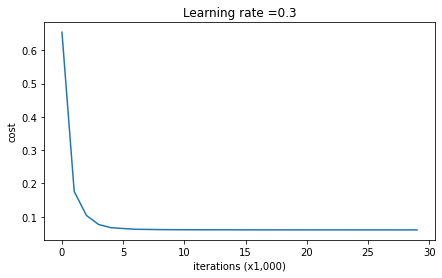

On the train set:
Accuracy: 0.9289099526066351
On the test set:
Accuracy: 0.95


In [34]:
parameters = model(train_X, train_Y, keep_prob = 0.86, learning_rate = 0.3)

print ("On the train set:")
predictions_train = predict(train_X, train_Y, parameters)
print ("On the test set:")
predictions_test = predict(test_X, test_Y, parameters)

Dropout works great! The test accuracy has increased again (to 95%)! Your model is not overfitting the training set and does a great job on the test set. The French football team will be forever grateful to you! 

Run the code below to plot the decision boundary.

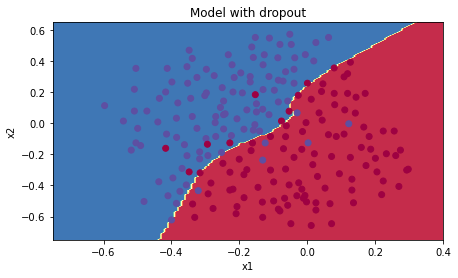

In [35]:
plt.title("Model with dropout")
axes = plt.gca()
axes.set_xlim([-0.75,0.40])
axes.set_ylim([-0.75,0.65])
plot_decision_boundary(lambda x: predict_dec(parameters, x.T), train_X, train_Y)

**Note**:
- A **common mistake** when using dropout is to use it both in training and testing. You should use dropout (randomly eliminate nodes) only in training. 
- Deep learning frameworks like [tensorflow](https://www.tensorflow.org/api_docs/python/tf/nn/dropout), [PaddlePaddle](http://doc.paddlepaddle.org/release_doc/0.9.0/doc/ui/api/trainer_config_helpers/attrs.html), [keras](https://keras.io/layers/core/#dropout) or [caffe](http://caffe.berkeleyvision.org/tutorial/layers/dropout.html) come with a dropout layer implementation. Don't stress - you will soon learn some of these frameworks.

<font color='blue'>
    
**What you should remember about dropout:**
- Dropout is a regularization technique.
- You only use dropout during training. Don't use dropout (randomly eliminate nodes) during test time.
- Apply dropout both during forward and backward propagation.
- During training time, divide each dropout layer by keep_prob to keep the same expected value for the activations. For example, if keep_prob is 0.5, then we will on average shut down half the nodes, so the output will be scaled by 0.5 since only the remaining half are contributing to the solution. Dividing by 0.5 is equivalent to multiplying by 2. Hence, the output now has the same expected value. You can check that this works even when keep_prob is other values than 0.5.  

<a name='7'></a>
## 7 - Conclusions

**Here are the results of our three models**: 

<table> 
    <tr>
        <td>
        <b>model</b>
        </td>
        <td>
        <b>train accuracy</b>
        </td>
        <td>
        <b>test accuracy</b>
        </td>
    </tr>
        <td>
        3-layer NN without regularization
        </td>
        <td>
        95%
        </td>
        <td>
        91.5%
        </td>
    <tr>
        <td>
        3-layer NN with L2-regularization
        </td>
        <td>
        94%
        </td>
        <td>
        93%
        </td>
    </tr>
    <tr>
        <td>
        3-layer NN with dropout
        </td>
        <td>
        93%
        </td>
        <td>
        95%
        </td>
    </tr>
</table> 

Note that regularization hurts training set performance! This is because it limits the ability of the network to overfit to the training set. But since it ultimately gives better test accuracy, it is helping your system. 

Congratulations for finishing this assignment! And also for revolutionizing French football. :-) 

<font color='blue'>
    
**What we want you to remember from this notebook**:
- Regularization will help you reduce overfitting.
- Regularization will drive your weights to lower values.
- L2 regularization and Dropout are two very effective regularization techniques.